In [1]:
import matplotlib
from matplotlib import pylab
%config InlineBackend.figure_format = 'retina'
matplotlib.rcParams['figure.dpi'] = 80
params = {'legend.fontsize': 'xx-large',
          'figure.figsize': (6, 4),
         'axes.labelsize': 'xx-large',
         'axes.titlesize': 'xx-large',
         'xtick.labelsize': 'x-large',
         'ytick.labelsize': 'x-large',
         'figure.facecolor': 'w'}
pylab.rcParams.update(params)
from matplotlib import pyplot as plt
import matplotlib.gridspec as gridspec

import h5py
import numpy as np
import os
import sys
from scipy.optimize import curve_fit

%load_ext autoreload
%autoreload 2
sys.path.insert(1, '../code')
from geometric_features import GeometricFeaturizer, geo_name
from scalar_features import ScalarFeaturizer, scalar_name
from read_halos import SimulationReader
from fit import LinearFitter
from neural_net import NeuralNet, NNFitter
import plotter
import utils
import feature_importance

In [2]:
# sim / halo info
base_dir = '/scratch/ksf293/equivariant-cosmology/data'
snap_num_str = '099' # z = 0
sim_name = 'TNG100-1'
sim_name_dark = 'TNG100-1-Dark'
# sim_name = 'TNG50-4'
# sim_name_dark = 'TNG50-4-Dark'
halo_dir = f'../data/halos/halos_{sim_name}'
halo_tag = '_nstarpartmin1_twin'
fn_dark_halo_arr = f'{halo_dir}/halos_{sim_name}{halo_tag}.npy'
mass_multiplier = 1e10
log_mass_shift = 10

In [3]:
# geo info
geo_dir = f'../data/geometric_features/geometric_features_{sim_name}'
geo_tag = '_xminPEsub_rall'
fn_geo_features = f'{geo_dir}/geometric_features{halo_tag}{geo_tag}.npy'
print(fn_geo_features)

../data/geometric_features/geometric_features_TNG100-1/geometric_features_nstarpartmin1_twin_xminPEsub_rall.npy


In [4]:
geo_featurizer = GeometricFeaturizer()
geo_featurizer.load_features(fn_geo_features)

In [5]:
n_groups = [[0,1,2], [3,4,5,6,7], [8,9,10]]
geo_feature_arr_rebinned = utils.rebin_geometric_features(geo_featurizer.geo_feature_arr, n_groups)
geo_feature_arr_pseudo = utils.transform_pseudotensors(geo_feature_arr_rebinned)

In [6]:
sim_reader = SimulationReader(base_dir, sim_name, sim_name_dark, snap_num_str)
sim_reader.load_dark_halo_arr(fn_dark_halo_arr)
sim_reader.read_simulations()
sim_reader.add_catalog_property_to_halos('mass_hydro_subhalo_star')
sim_reader.add_catalog_property_to_halos('m200m')

In [7]:
sim_reader.add_catalog_property_to_halos('r200m')
sim_reader.add_catalog_property_to_halos('v200m')

In [8]:
m_stellar = np.array([dark_halo.catalog_properties['mass_hydro_subhalo_star'] for dark_halo in sim_reader.dark_halo_arr])
m_200m = np.array([dark_halo.catalog_properties['m200m'] for dark_halo in sim_reader.dark_halo_arr])
log_m_stellar = np.log10(m_stellar)
log_m_200m = np.log10(m_200m)
N_halos = len(sim_reader.dark_halo_arr)
print('N_halos:', N_halos)

N_halos: 20098


In [9]:
r_200m = np.array([dark_halo.catalog_properties['r200m'] for dark_halo in sim_reader.dark_halo_arr])
v_200m = np.array([dark_halo.catalog_properties['v200m'] for dark_halo in sim_reader.dark_halo_arr])

Text(0, 0.5, 'count')

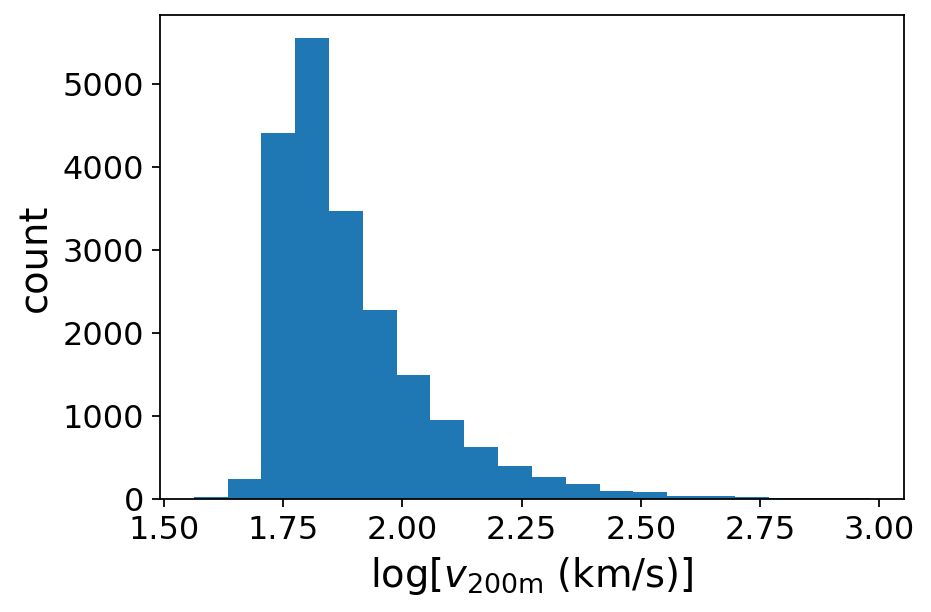

In [10]:
plt.hist(np.log10(v_200m), bins=20)
plt.xlabel(r'$\mathrm{log}[v_{200\mathrm{m}}$ (km/s)]')
plt.ylabel('count')

Text(0, 0.5, '$R_{200m}$ ($h^{-1} \\,$ ckpc)')

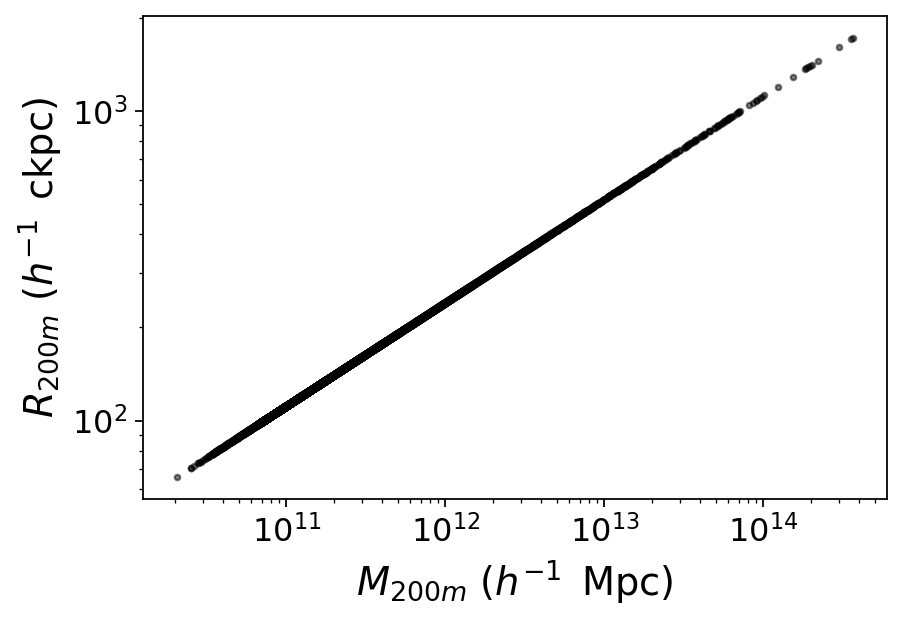

In [11]:
plt.scatter(m_200m*mass_multiplier, r_200m, c='k', s=6, alpha=0.5)
plt.loglog()
plt.xlabel(r'$M_{200m}$ ($h^{-1} \,$ Mpc)')
plt.ylabel(r'$R_{200m}$ ($h^{-1} \,$ ckpc)')

Text(0, 0.5, '$V_{200m}$ (km/s)')

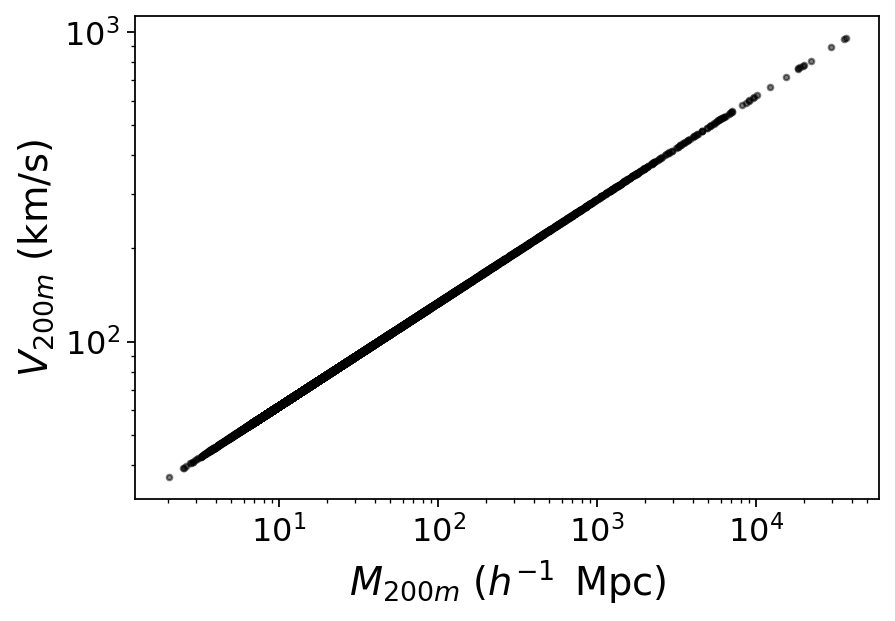

In [12]:
plt.scatter(m_200m, v_200m, c='k', s=6, alpha=0.5)
plt.loglog()
plt.xlabel(r'$M_{200m}$ ($h^{-1} \,$ Mpc)')
plt.ylabel(r'$V_{200m}$ (km/s)')

## Set up general scalar featurizer

In [13]:
# scalar info
scalar_featurizer = ScalarFeaturizer(geo_feature_arr_pseudo)
scalar_featurizer.rescale_geometric_features(m_200m, r_200m, v_200m)

# m_dm is in units of 1/1e10, this M_tot value is already in the units we're using internally (log(M/1e10))
x_features_extra = np.vstack((m_200m, r_200m, v_200m)).T
x_features_extra = np.log10(x_features_extra)   

## Split train-val-test

In [14]:
frac_train = 0.70
frac_test = 0.15

random_ints = np.array([dark_halo.random_int for dark_halo in sim_reader.dark_halo_arr])
idx_train, idx_val, idx_test = utils.split_train_val_test(random_ints, frac_train=frac_train, frac_test=frac_test)

print(len(idx_train), len(idx_test), len(idx_val))

14068 3015 3015


## Uncertainties & powerlaw

In [15]:
x_label_name = 'm_200m'
y_label_name = 'm_stellar'
uncertainties_genel2019 = utils.get_uncertainties_genel2019(y_label_name, log_m_stellar+log_mass_shift, sim_name=sim_name)

In [16]:
log_m_200m_train = log_m_200m[idx_train]
log_m_stellar_train = log_m_stellar[idx_train]
uncertainties_genel2019_train = uncertainties_genel2019[idx_train]
y_val_current_powerlaw_fit_train, params_best_fit, params_initial_guess = utils.fit_broken_power_law(
                                                        log_m_200m_train, log_m_stellar_train, 
                                                        uncertainties=uncertainties_genel2019_train, 
                                                        return_initial_guess=True)
y_val_current_powerlaw_fit = utils.broken_power_law(log_m_200m, *params_best_fit)

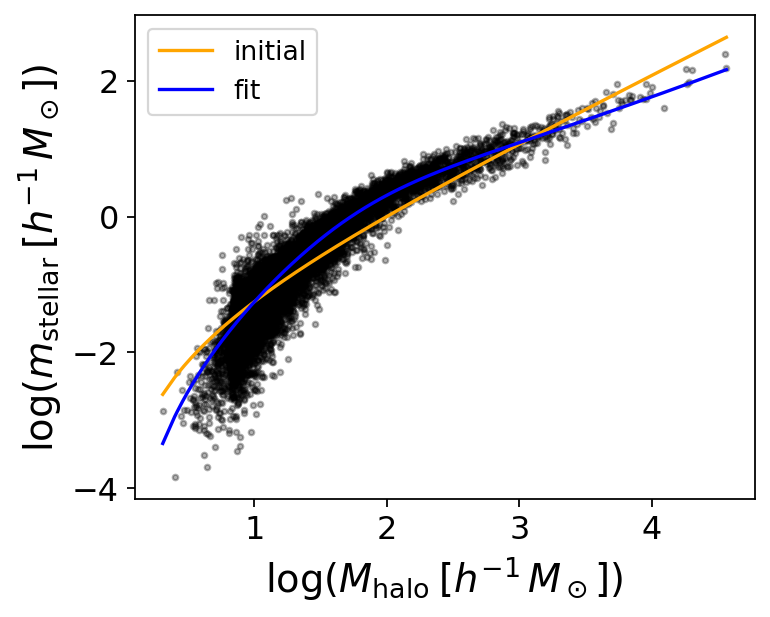

In [17]:
plt.figure(figsize=(5,4))
# sort for plotting niceness
idx_m_200m = np.argsort(log_m_200m_train)
y_initial_train = utils.broken_power_law(log_m_200m_train, *params_initial_guess)
plt.scatter(log_m_200m_train[idx_m_200m], log_m_stellar_train[idx_m_200m], s=6, c='k', alpha=0.3)
plt.plot(log_m_200m_train[idx_m_200m], y_initial_train[idx_m_200m], color='orange', label='initial')
plt.plot(log_m_200m_train[idx_m_200m], y_val_current_powerlaw_fit_train[idx_m_200m], color='blue', label='fit')
plt.xlabel(utils.label_dict[x_label_name])
plt.ylabel(utils.label_dict[y_label_name])
plt.legend(fontsize=12)

## Baseline

0.25233400290871244


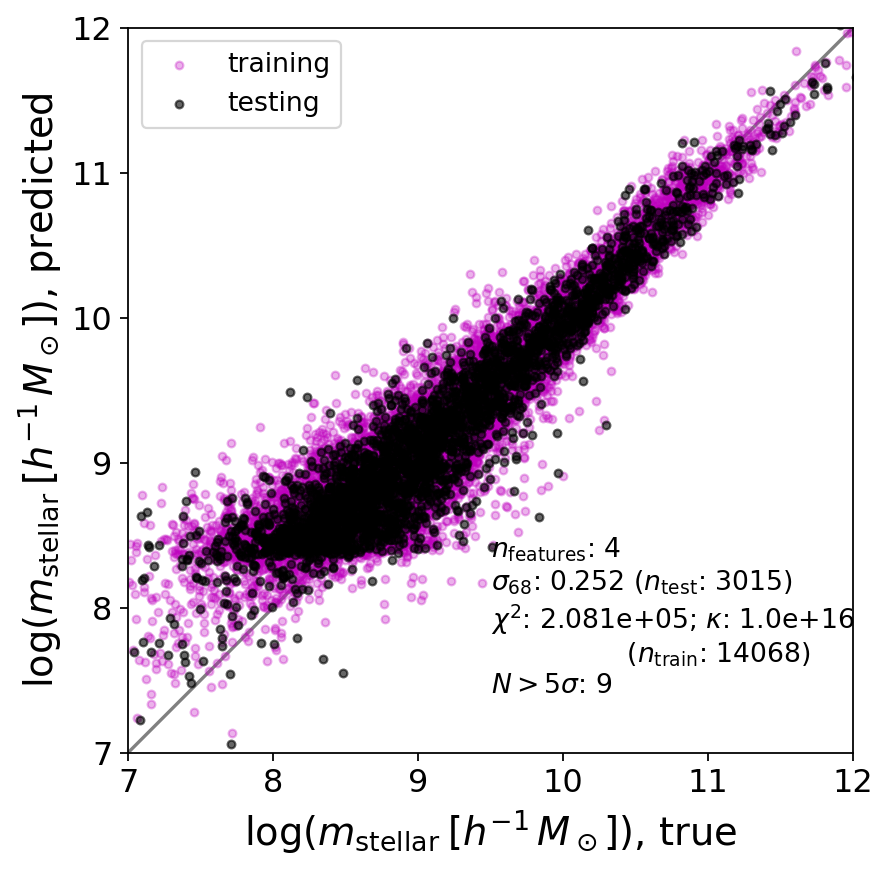

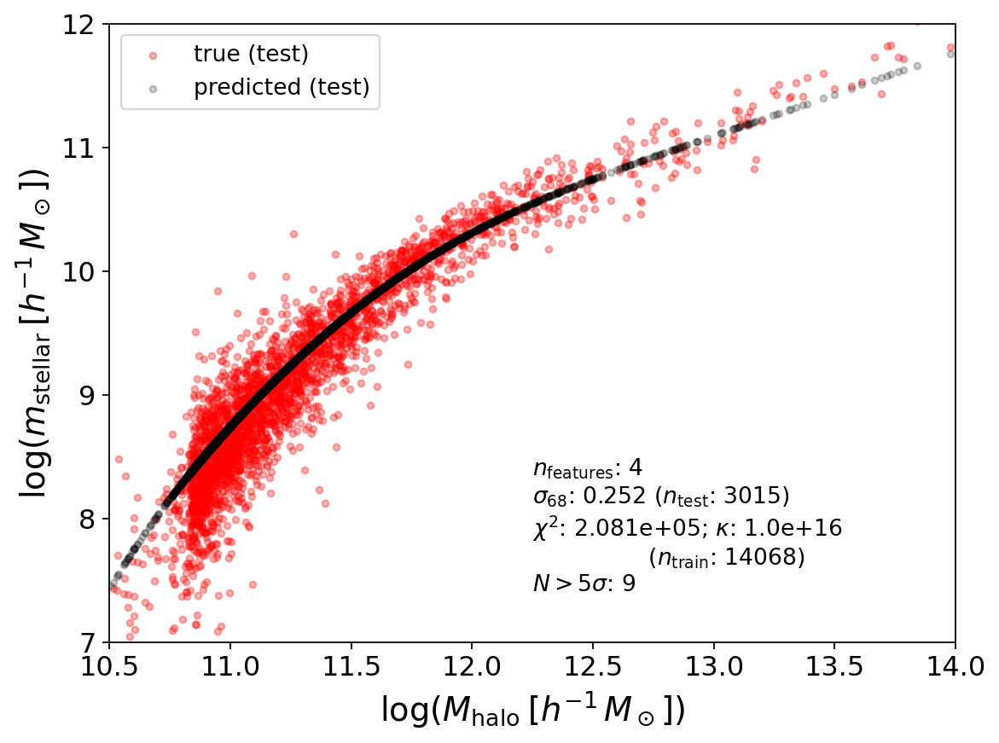

In [18]:
ones_features = np.atleast_2d(np.ones(len(log_m_stellar))).T
x_extra_mtot = np.atleast_2d(np.log10(m_200m)).T
fitter_M = LinearFitter(ones_features, log_m_stellar, 
                    y_val_current_powerlaw_fit, uncertainties=uncertainties_genel2019,
                    x_features_extra=x_extra_mtot)
fitter_M.split_train_test(idx_train, idx_val)
fitter_M.scale_and_fit(rms_x=True, log_x=False, log_y=False)
fitter_M.predict_test()
plotter.plot_fits(x_label_name, y_label_name, fitter_M, log_m_200m, log_mass_shift=log_mass_shift)
error_powerlawM, _ = utils.compute_error(fitter_M, test_error_type='percentile')
print(error_powerlawM)

0.2525814660303075


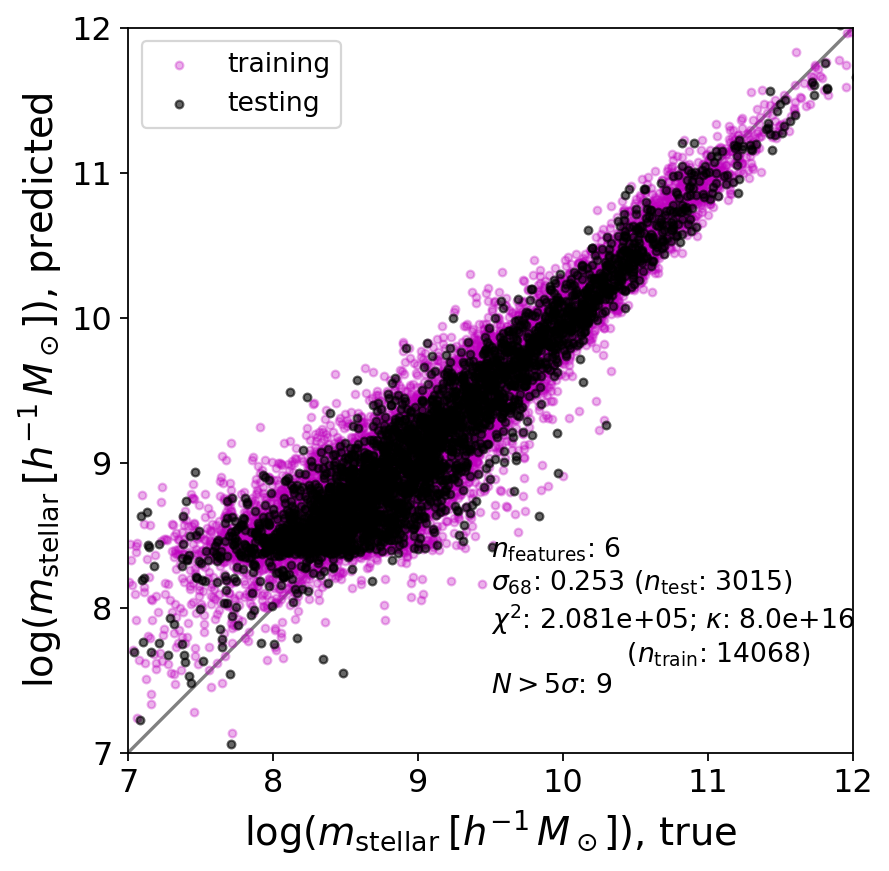

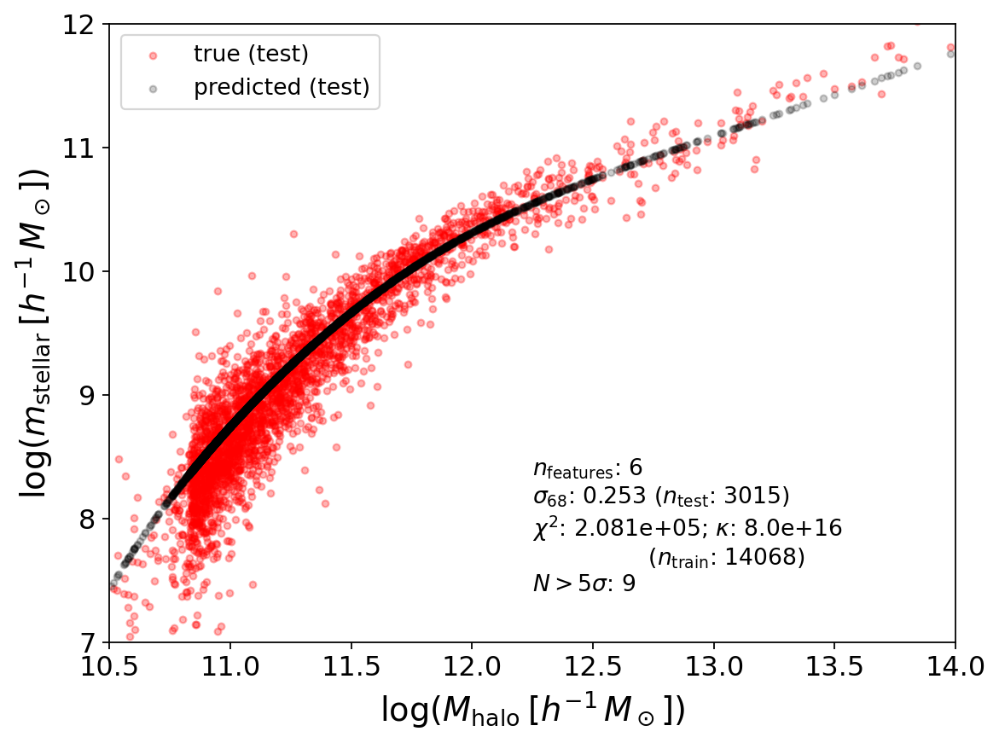

In [19]:
ones_features = np.atleast_2d(np.ones(len(log_m_stellar))).T
#x_extra_mtot = np.atleast_2d(np.log10(m_200m)).T
fitter_MRV = LinearFitter(ones_features, log_m_stellar, 
                    y_val_current_powerlaw_fit, uncertainties=uncertainties_genel2019,
                    x_features_extra=x_features_extra)
fitter_MRV.split_train_test(idx_train, idx_val)
fitter_MRV.scale_and_fit(rms_x=True, log_x=False, log_y=False)
fitter_MRV.predict_test()
plotter.plot_fits(x_label_name, y_label_name, fitter_MRV, log_m_200m, log_mass_shift=log_mass_shift)
error_powerlawMRV, _ = utils.compute_error(fitter_MRV, test_error_type='percentile')
print(error_powerlawMRV)

## Full scalar featurizer

In [20]:
from IPython.display import display, Markdown

In [21]:
m_order_max = 2
x_order_max = 4
v_order_max = 4
scalar_tag = f'_3bins_pseudo_rescaled_mord{m_order_max}_xord{x_order_max}_vord{v_order_max}'
scalar_dir = f'../data/scalar_features/scalar_features_{sim_name}'
fn_scalar_features = f'{scalar_dir}/scalar_features{halo_tag}{geo_tag}{scalar_tag}.npy'

print('loading')
scalar_featurizer.load_features(fn_scalar_features)
print('loaded')
s_feats = [s for s in scalar_featurizer.scalar_feature_arr[0]]
for s in s_feats:
    display(Markdown(scalar_name(s, geo_feature_arr_pseudo)))

loading
loaded


$m_0$

$m_1$

$m_2$

$\lambda_3\left(C^{vv}_0\right)$

$\lambda_1\left(C^{vv}_0\right)$

$\lambda_2\left(C^{vv}_0\right)$

$\lambda_3\left(C^{vv}_1\right)$

$\lambda_2\left(C^{vv}_1\right)$

$\lambda_1\left(C^{vv}_1\right)$

$\lambda_1\left(C^{vv}_2\right)$

$\lambda_2\left(C^{vv}_2\right)$

$\lambda_3\left(C^{vv}_2\right)$

$\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right)$

$\lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_2\left(C^{xx}_0\right)$

$\lambda_3\left(C^{xx}_0\right)$

$\lambda_1\left(C^{xx}_0\right)$

$\lambda_3\left(C^{xx}_1\right)$

$\lambda_2\left(C^{xx}_1\right)$

$\lambda_1\left(C^{xx}_1\right)$

$\lambda_2\left(C^{xx}_2\right)$

$\lambda_1\left(C^{xx}_2\right)$

$\lambda_3\left(C^{xx}_2\right)$

$m_0 \, m_0$

$m_0 \, m_1$

$m_0 \, m_2$

$m_1 \, m_1$

$m_1 \, m_2$

$m_2 \, m_2$

$m_0 \, \lambda_1\left(C^{vv}_0\right)$

$m_0 \, \lambda_2\left(C^{vv}_0\right)$

$m_0 \, \lambda_3\left(C^{vv}_0\right)$

$[v_0]_{j} \, [v_0]_{j}$

$\lambda_1\left(C^{vv}_0\right) \, m_1$

$\lambda_3\left(C^{vv}_0\right) \, m_1$

$m_0 \, \lambda_3\left(C^{vv}_1\right)$

$m_0 \, \lambda_2\left(C^{vv}_1\right)$

$\lambda_2\left(C^{vv}_0\right) \, m_1$

$[v_0]_{j} \, [v_1]_{j}$

$m_0 \, \lambda_1\left(C^{vv}_1\right)$

$[v_0]_{j} \, [v_2]_{j}$

$m_0 \, \lambda_2\left(C^{vv}_2\right)$

$\lambda_3\left(C^{vv}_0\right) \, m_2$

$m_0 \, \lambda_3\left(C^{vv}_2\right)$

$\lambda_1\left(C^{vv}_0\right) \, m_2$

$\lambda_2\left(C^{vv}_0\right) \, m_2$

$m_0 \, \lambda_1\left(C^{vv}_2\right)$

$[v_1]_{j} \, [v_1]_{j}$

$m_1 \, \lambda_1\left(C^{vv}_1\right)$

$m_1 \, \lambda_2\left(C^{vv}_1\right)$

$m_1 \, \lambda_3\left(C^{vv}_1\right)$

$[v_1]_{j} \, [v_2]_{j}$

$m_1 \, \lambda_3\left(C^{vv}_2\right)$

$m_1 \, \lambda_2\left(C^{vv}_2\right)$

$m_1 \, \lambda_1\left(C^{vv}_2\right)$

$\lambda_3\left(C^{vv}_1\right) \, m_2$

$\lambda_2\left(C^{vv}_1\right) \, m_2$

$\lambda_1\left(C^{vv}_1\right) \, m_2$

$[v_2]_{j} \, [v_2]_{j}$

$m_2 \, \lambda_3\left(C^{vv}_2\right)$

$m_2 \, \lambda_2\left(C^{vv}_2\right)$

$m_2 \, \lambda_1\left(C^{vv}_2\right)$

$\lambda_2\left(C^{vv}_0\right) \, \lambda_2\left(C^{vv}_0\right)$

$\lambda_2\left(C^{vv}_0\right) \, \lambda_1\left(C^{vv}_0\right)$

$\lambda_1\left(C^{vv}_0\right) \, \lambda_1\left(C^{vv}_0\right)$

$\lambda_3\left(C^{vv}_0\right) \, \lambda_3\left(C^{vv}_0\right)$

$\lambda_3\left(C^{vv}_0\right) \, \lambda_2\left(C^{vv}_0\right)$

$\lambda_3\left(C^{vv}_0\right) \, \lambda_1\left(C^{vv}_0\right)$

$[C^{vv}_0]_{jk} \, [C^{vv}_0]_{jk}$

$\lambda_1\left(C^{vv}_0\right) \, \lambda_1\left(C^{vv}_1\right)$

$\lambda_3\left(C^{vv}_0\right) \, \lambda_3\left(C^{vv}_1\right)$

$\lambda_3\left(C^{vv}_0\right) \, \lambda_2\left(C^{vv}_1\right)$

$\lambda_3\left(C^{vv}_0\right) \, \lambda_1\left(C^{vv}_1\right)$

$\lambda_1\left(C^{vv}_0\right) \, \lambda_2\left(C^{vv}_1\right)$

$\lambda_2\left(C^{vv}_0\right) \, \lambda_3\left(C^{vv}_1\right)$

$[C^{vv}_0]_{jk} \, [C^{vv}_1]_{jk}$

$\lambda_2\left(C^{vv}_0\right) \, \lambda_1\left(C^{vv}_1\right)$

$\lambda_1\left(C^{vv}_0\right) \, \lambda_3\left(C^{vv}_1\right)$

$\lambda_2\left(C^{vv}_0\right) \, \lambda_2\left(C^{vv}_1\right)$

$\lambda_2\left(C^{vv}_0\right) \, \lambda_3\left(C^{vv}_2\right)$

$\lambda_3\left(C^{vv}_0\right) \, \lambda_1\left(C^{vv}_2\right)$

$\lambda_3\left(C^{vv}_0\right) \, \lambda_2\left(C^{vv}_2\right)$

$\lambda_1\left(C^{vv}_0\right) \, \lambda_2\left(C^{vv}_2\right)$

$\lambda_1\left(C^{vv}_0\right) \, \lambda_1\left(C^{vv}_2\right)$

$\lambda_2\left(C^{vv}_0\right) \, \lambda_2\left(C^{vv}_2\right)$

$\lambda_2\left(C^{vv}_0\right) \, \lambda_1\left(C^{vv}_2\right)$

$[C^{vv}_0]_{jk} \, [C^{vv}_2]_{jk}$

$\lambda_1\left(C^{vv}_0\right) \, \lambda_3\left(C^{vv}_2\right)$

$\lambda_3\left(C^{vv}_0\right) \, \lambda_3\left(C^{vv}_2\right)$

$\lambda_3\left(C^{vv}_1\right) \, \lambda_1\left(C^{vv}_1\right)$

$[C^{vv}_1]_{jk} \, [C^{vv}_1]_{jk}$

$\lambda_2\left(C^{vv}_1\right) \, \lambda_2\left(C^{vv}_1\right)$

$\lambda_2\left(C^{vv}_1\right) \, \lambda_1\left(C^{vv}_1\right)$

$\lambda_3\left(C^{vv}_1\right) \, \lambda_3\left(C^{vv}_1\right)$

$\lambda_3\left(C^{vv}_1\right) \, \lambda_2\left(C^{vv}_1\right)$

$\lambda_1\left(C^{vv}_1\right) \, \lambda_1\left(C^{vv}_1\right)$

$\lambda_2\left(C^{vv}_1\right) \, \lambda_2\left(C^{vv}_2\right)$

$\lambda_2\left(C^{vv}_1\right) \, \lambda_3\left(C^{vv}_2\right)$

$\lambda_3\left(C^{vv}_1\right) \, \lambda_2\left(C^{vv}_2\right)$

$\lambda_2\left(C^{vv}_1\right) \, \lambda_1\left(C^{vv}_2\right)$

$\lambda_3\left(C^{vv}_1\right) \, \lambda_1\left(C^{vv}_2\right)$

$\lambda_3\left(C^{vv}_1\right) \, \lambda_3\left(C^{vv}_2\right)$

$\lambda_1\left(C^{vv}_1\right) \, \lambda_1\left(C^{vv}_2\right)$

$\lambda_1\left(C^{vv}_1\right) \, \lambda_2\left(C^{vv}_2\right)$

$\lambda_1\left(C^{vv}_1\right) \, \lambda_3\left(C^{vv}_2\right)$

$[C^{vv}_1]_{jk} \, [C^{vv}_2]_{jk}$

$\lambda_2\left(C^{vv}_2\right) \, \lambda_2\left(C^{vv}_2\right)$

$\lambda_3\left(C^{vv}_2\right) \, \lambda_2\left(C^{vv}_2\right)$

$\lambda_3\left(C^{vv}_2\right) \, \lambda_3\left(C^{vv}_2\right)$

$\lambda_3\left(C^{vv}_2\right) \, \lambda_1\left(C^{vv}_2\right)$

$\lambda_1\left(C^{vv}_2\right) \, \lambda_1\left(C^{vv}_2\right)$

$[C^{vv}_2]_{jk} \, [C^{vv}_2]_{jk}$

$\lambda_2\left(C^{vv}_2\right) \, \lambda_1\left(C^{vv}_2\right)$

$m_0 \, \lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right)$

$[v_0]_{j} \, [x_0]_{j}$

$m_0 \, \lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right)$

$m_0 \, \lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right)$

$m_0 \, \lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$m_0 \, \lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, m_1$

$m_0 \, \lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, m_1$

$[x_0]_{j} \, [v_1]_{j}$

$\lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, m_1$

$[v_0]_{j} \, [x_1]_{j}$

$[v_0]_{j} \, [x_2]_{j}$

$\lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, m_2$

$m_0 \, \lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$m_0 \, \lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$m_0 \, \lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$[x_0]_{j} \, [v_2]_{j}$

$\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, m_2$

$\lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, m_2$

$m_1 \, \lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$[v_1]_{j} \, [x_1]_{j}$

$m_1 \, \lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$m_1 \, \lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$[v_1]_{j} \, [x_2]_{j}$

$\lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, m_2$

$\lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, m_2$

$[x_1]_{j} \, [v_2]_{j}$

$m_1 \, \lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, m_2$

$m_1 \, \lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$m_1 \, \lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$m_2 \, \lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$[v_2]_{j} \, [x_2]_{j}$

$m_2 \, \lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$m_2 \, \lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$[C^{vv}_0]_{jk} \, [\frac{1}{2} (C^{xv}_0 + C^{vx}_0)]_{jk}$

$\lambda_1\left(C^{vv}_0\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right)$

$\lambda_1\left(C^{vv}_0\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right)$

$\lambda_1\left(C^{vv}_0\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right)$

$\lambda_2\left(C^{vv}_0\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right)$

$\lambda_3\left(C^{vv}_0\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right)$

$\lambda_3\left(C^{vv}_0\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right)$

$\lambda_2\left(C^{vv}_0\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right)$

$\lambda_2\left(C^{vv}_0\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right)$

$\lambda_3\left(C^{vv}_0\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right)$

$\lambda_1\left(C^{vv}_0\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_1\left(C^{vv}_0\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_2\left(C^{vv}_1\right)$

$\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_1\left(C^{vv}_1\right)$

$\lambda_3\left(C^{vv}_0\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_2\left(C^{vv}_0\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_1\left(C^{vv}_1\right)$

$\lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_2\left(C^{vv}_1\right)$

$\lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_3\left(C^{vv}_1\right)$

$[C^{vv}_0]_{jk} \, [\frac{1}{2} (C^{xv}_1 + C^{vx}_1)]_{jk}$

$[\frac{1}{2} (C^{xv}_0 + C^{vx}_0)]_{jk} \, [C^{vv}_1]_{jk}$

$\lambda_1\left(C^{vv}_0\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_3\left(C^{vv}_0\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_3\left(C^{vv}_1\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_1\left(C^{vv}_1\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_2\left(C^{vv}_1\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_3\left(C^{vv}_1\right)$

$\lambda_2\left(C^{vv}_0\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_2\left(C^{vv}_0\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_3\left(C^{vv}_0\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_2\left(C^{vv}_2\right)$

$\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_3\left(C^{vv}_2\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_2\left(C^{vv}_2\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_1\left(C^{vv}_2\right)$

$\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_1\left(C^{vv}_2\right)$

$\lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_1\left(C^{vv}_2\right)$

$\lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_2\left(C^{vv}_2\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_3\left(C^{vv}_2\right)$

$\lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_3\left(C^{vv}_2\right)$

$\lambda_3\left(C^{vv}_0\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_3\left(C^{vv}_0\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_3\left(C^{vv}_0\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_2\left(C^{vv}_0\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_2\left(C^{vv}_0\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_2\left(C^{vv}_0\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$[\frac{1}{2} (C^{xv}_0 + C^{vx}_0)]_{jk} \, [C^{vv}_2]_{jk}$

$\lambda_1\left(C^{vv}_0\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_1\left(C^{vv}_0\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_1\left(C^{vv}_0\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$[C^{vv}_0]_{jk} \, [\frac{1}{2} (C^{xv}_2 + C^{vx}_2)]_{jk}$

$\lambda_3\left(C^{vv}_1\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_3\left(C^{vv}_1\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_3\left(C^{vv}_1\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_1\left(C^{vv}_1\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_2\left(C^{vv}_1\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_1\left(C^{vv}_1\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_1\left(C^{vv}_1\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$[C^{vv}_1]_{jk} \, [\frac{1}{2} (C^{xv}_1 + C^{vx}_1)]_{jk}$

$\lambda_2\left(C^{vv}_1\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_2\left(C^{vv}_1\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_2\left(C^{vv}_2\right)$

$[\frac{1}{2} (C^{xv}_1 + C^{vx}_1)]_{jk} \, [C^{vv}_2]_{jk}$

$[C^{vv}_1]_{jk} \, [\frac{1}{2} (C^{xv}_2 + C^{vx}_2)]_{jk}$

$\lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_3\left(C^{vv}_2\right)$

$\lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_1\left(C^{vv}_2\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_1\left(C^{vv}_2\right)$

$\lambda_2\left(C^{vv}_1\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_3\left(C^{vv}_2\right)$

$\lambda_2\left(C^{vv}_1\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_2\left(C^{vv}_1\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_3\left(C^{vv}_1\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_2\left(C^{vv}_2\right)$

$\lambda_3\left(C^{vv}_1\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_3\left(C^{vv}_2\right)$

$\lambda_1\left(C^{vv}_1\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_1\left(C^{vv}_2\right)$

$\lambda_1\left(C^{vv}_1\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_2\left(C^{vv}_2\right)$

$\lambda_1\left(C^{vv}_1\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_3\left(C^{vv}_1\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_1\left(C^{vv}_2\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_1\left(C^{vv}_2\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_1\left(C^{vv}_2\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_2\left(C^{vv}_2\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_2\left(C^{vv}_2\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_2\left(C^{vv}_2\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_3\left(C^{vv}_2\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_3\left(C^{vv}_2\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$[C^{vv}_2]_{jk} \, [\frac{1}{2} (C^{xv}_2 + C^{vx}_2)]_{jk}$

$\lambda_3\left(C^{vv}_2\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$m_0 \, \lambda_3\left(C^{xx}_0\right)$

$m_0 \, \lambda_2\left(C^{xx}_0\right)$

$m_0 \, \lambda_1\left(C^{xx}_0\right)$

$[x_0]_{j} \, [x_0]_{j}$

$\lambda_1\left(C^{xx}_0\right) \, m_1$

$\lambda_3\left(C^{xx}_0\right) \, m_1$

$[x_0]_{j} \, [x_1]_{j}$

$\lambda_2\left(C^{xx}_0\right) \, m_1$

$m_0 \, \lambda_1\left(C^{xx}_1\right)$

$m_0 \, \lambda_3\left(C^{xx}_1\right)$

$m_0 \, \lambda_2\left(C^{xx}_1\right)$

$\lambda_3\left(C^{xx}_0\right) \, m_2$

$\lambda_1\left(C^{xx}_0\right) \, m_2$

$m_0 \, \lambda_1\left(C^{xx}_2\right)$

$m_0 \, \lambda_2\left(C^{xx}_2\right)$

$m_0 \, \lambda_3\left(C^{xx}_2\right)$

$[x_0]_{j} \, [x_2]_{j}$

$\lambda_2\left(C^{xx}_0\right) \, m_2$

$m_1 \, \lambda_3\left(C^{xx}_1\right)$

$[x_1]_{j} \, [x_1]_{j}$

$m_1 \, \lambda_1\left(C^{xx}_1\right)$

$m_1 \, \lambda_2\left(C^{xx}_1\right)$

$\lambda_2\left(C^{xx}_1\right) \, m_2$

$\lambda_1\left(C^{xx}_1\right) \, m_2$

$m_1 \, \lambda_1\left(C^{xx}_2\right)$

$m_1 \, \lambda_2\left(C^{xx}_2\right)$

$[x_1]_{j} \, [x_2]_{j}$

$\lambda_3\left(C^{xx}_1\right) \, m_2$

$m_1 \, \lambda_3\left(C^{xx}_2\right)$

$m_2 \, \lambda_3\left(C^{xx}_2\right)$

$[x_2]_{j} \, [x_2]_{j}$

$m_2 \, \lambda_1\left(C^{xx}_2\right)$

$m_2 \, \lambda_2\left(C^{xx}_2\right)$

$\lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right)$

$\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right)$

$\lambda_1\left(C^{vv}_0\right) \, \lambda_2\left(C^{xx}_0\right)$

$\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right)$

$\lambda_1\left(C^{vv}_0\right) \, \lambda_1\left(C^{xx}_0\right)$

$\lambda_2\left(C^{vv}_0\right) \, \lambda_1\left(C^{xx}_0\right)$

$\lambda_2\left(C^{vv}_0\right) \, \lambda_2\left(C^{xx}_0\right)$

$\lambda_2\left(C^{vv}_0\right) \, \lambda_3\left(C^{xx}_0\right)$

$\lambda_3\left(C^{vv}_0\right) \, \lambda_1\left(C^{xx}_0\right)$

$[C^{vv}_0]_{jk} \, [C^{xx}_0]_{jk}$

$\lambda_3\left(C^{vv}_0\right) \, \lambda_2\left(C^{xx}_0\right)$

$\lambda_3\left(C^{vv}_0\right) \, \lambda_3\left(C^{xx}_0\right)$

$[\frac{1}{2} (C^{xv}_0 + C^{vx}_0)]_{jk} \, [\frac{1}{2} (C^{xv}_0 + C^{vx}_0)]_{jk}$

$\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right)$

$\lambda_1\left(C^{vv}_0\right) \, \lambda_3\left(C^{xx}_0\right)$

$[\frac{1}{2} (C^{xv}_0 - C^{vx}_0)]_{jk} \, [\frac{1}{2} (C^{xv}_0 - C^{vx}_0)]_{jk}$

$\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_2\left(C^{xx}_0\right) \, \lambda_3\left(C^{vv}_1\right)$

$\lambda_1\left(C^{vv}_0\right) \, \lambda_3\left(C^{xx}_1\right)$

$\lambda_1\left(C^{vv}_0\right) \, \lambda_2\left(C^{xx}_1\right)$

$\lambda_1\left(C^{vv}_0\right) \, \lambda_1\left(C^{xx}_1\right)$

$[C^{vv}_0]_{jk} \, [C^{xx}_1]_{jk}$

$\lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_2\left(C^{vv}_0\right) \, \lambda_1\left(C^{xx}_1\right)$

$[C^{xx}_0]_{jk} \, [C^{vv}_1]_{jk}$

$\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_2\left(C^{xx}_0\right) \, \lambda_1\left(C^{vv}_1\right)$

$[\frac{1}{2} (C^{xv}_0 - C^{vx}_0)]_{jk} \, [\frac{1}{2} (C^{xv}_1 - C^{vx}_1)]_{jk}$

$\lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_2\left(C^{xx}_0\right) \, \lambda_2\left(C^{vv}_1\right)$

$\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_3\left(C^{xx}_0\right) \, \lambda_3\left(C^{vv}_1\right)$

$[\frac{1}{2} (C^{xv}_0 + C^{vx}_0)]_{jk} \, [\frac{1}{2} (C^{xv}_1 + C^{vx}_1)]_{jk}$

$\lambda_2\left(C^{vv}_0\right) \, \lambda_3\left(C^{xx}_1\right)$

$\lambda_2\left(C^{vv}_0\right) \, \lambda_2\left(C^{xx}_1\right)$

$\lambda_3\left(C^{vv}_0\right) \, \lambda_3\left(C^{xx}_1\right)$

$\lambda_3\left(C^{vv}_0\right) \, \lambda_2\left(C^{xx}_1\right)$

$\lambda_3\left(C^{vv}_0\right) \, \lambda_1\left(C^{xx}_1\right)$

$\lambda_3\left(C^{xx}_0\right) \, \lambda_2\left(C^{vv}_1\right)$

$\lambda_3\left(C^{xx}_0\right) \, \lambda_1\left(C^{vv}_1\right)$

$\lambda_1\left(C^{xx}_0\right) \, \lambda_1\left(C^{vv}_1\right)$

$\lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_1\left(C^{xx}_0\right) \, \lambda_2\left(C^{vv}_1\right)$

$\lambda_1\left(C^{xx}_0\right) \, \lambda_3\left(C^{vv}_1\right)$

$\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$[C^{xx}_0]_{jk} \, [C^{vv}_2]_{jk}$

$[C^{vv}_0]_{jk} \, [C^{xx}_2]_{jk}$

$\lambda_3\left(C^{xx}_0\right) \, \lambda_3\left(C^{vv}_2\right)$

$[\frac{1}{2} (C^{xv}_0 + C^{vx}_0)]_{jk} \, [\frac{1}{2} (C^{xv}_2 + C^{vx}_2)]_{jk}$

$\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_3\left(C^{vv}_0\right) \, \lambda_1\left(C^{xx}_2\right)$

$\lambda_3\left(C^{vv}_0\right) \, \lambda_3\left(C^{xx}_2\right)$

$\lambda_3\left(C^{vv}_0\right) \, \lambda_2\left(C^{xx}_2\right)$

$\lambda_3\left(C^{xx}_0\right) \, \lambda_2\left(C^{vv}_2\right)$

$\lambda_1\left(C^{vv}_0\right) \, \lambda_1\left(C^{xx}_2\right)$

$\lambda_1\left(C^{vv}_0\right) \, \lambda_2\left(C^{xx}_2\right)$

$\lambda_1\left(C^{vv}_0\right) \, \lambda_3\left(C^{xx}_2\right)$

$\lambda_3\left(C^{xx}_0\right) \, \lambda_1\left(C^{vv}_2\right)$

$\lambda_2\left(C^{vv}_0\right) \, \lambda_1\left(C^{xx}_2\right)$

$\lambda_2\left(C^{vv}_0\right) \, \lambda_2\left(C^{xx}_2\right)$

$\lambda_2\left(C^{vv}_0\right) \, \lambda_3\left(C^{xx}_2\right)$

$\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_2\left(C^{xx}_0\right) \, \lambda_3\left(C^{vv}_2\right)$

$\lambda_1\left(C^{xx}_0\right) \, \lambda_1\left(C^{vv}_2\right)$

$\lambda_1\left(C^{xx}_0\right) \, \lambda_3\left(C^{vv}_2\right)$

$\lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$[\frac{1}{2} (C^{xv}_0 - C^{vx}_0)]_{jk} \, [\frac{1}{2} (C^{xv}_2 - C^{vx}_2)]_{jk}$

$\lambda_1\left(C^{xx}_0\right) \, \lambda_2\left(C^{vv}_2\right)$

$\lambda_2\left(C^{xx}_0\right) \, \lambda_2\left(C^{vv}_2\right)$

$\lambda_2\left(C^{xx}_0\right) \, \lambda_1\left(C^{vv}_2\right)$

$[C^{vv}_1]_{jk} \, [C^{xx}_1]_{jk}$

$\lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_2\left(C^{vv}_1\right) \, \lambda_1\left(C^{xx}_1\right)$

$\lambda_2\left(C^{vv}_1\right) \, \lambda_2\left(C^{xx}_1\right)$

$\lambda_2\left(C^{vv}_1\right) \, \lambda_3\left(C^{xx}_1\right)$

$[\frac{1}{2} (C^{xv}_1 + C^{vx}_1)]_{jk} \, [\frac{1}{2} (C^{xv}_1 + C^{vx}_1)]_{jk}$

$\lambda_3\left(C^{vv}_1\right) \, \lambda_3\left(C^{xx}_1\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_1\left(C^{vv}_1\right) \, \lambda_3\left(C^{xx}_1\right)$

$\lambda_1\left(C^{vv}_1\right) \, \lambda_2\left(C^{xx}_1\right)$

$\lambda_1\left(C^{vv}_1\right) \, \lambda_1\left(C^{xx}_1\right)$

$\lambda_3\left(C^{vv}_1\right) \, \lambda_1\left(C^{xx}_1\right)$

$\lambda_3\left(C^{vv}_1\right) \, \lambda_2\left(C^{xx}_1\right)$

$[\frac{1}{2} (C^{xv}_1 - C^{vx}_1)]_{jk} \, [\frac{1}{2} (C^{xv}_1 - C^{vx}_1)]_{jk}$

$\lambda_1\left(C^{vv}_1\right) \, \lambda_2\left(C^{xx}_2\right)$

$\lambda_1\left(C^{vv}_1\right) \, \lambda_1\left(C^{xx}_2\right)$

$\lambda_1\left(C^{vv}_1\right) \, \lambda_3\left(C^{xx}_2\right)$

$\lambda_3\left(C^{xx}_1\right) \, \lambda_2\left(C^{vv}_2\right)$

$\lambda_2\left(C^{xx}_1\right) \, \lambda_1\left(C^{vv}_2\right)$

$\lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_2\left(C^{xx}_1\right) \, \lambda_2\left(C^{vv}_2\right)$

$\lambda_3\left(C^{xx}_1\right) \, \lambda_3\left(C^{vv}_2\right)$

$\lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_2\left(C^{xx}_1\right) \, \lambda_3\left(C^{vv}_2\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_3\left(C^{xx}_1\right) \, \lambda_1\left(C^{vv}_2\right)$

$[C^{vv}_1]_{jk} \, [C^{xx}_2]_{jk}$

$\lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_3\left(C^{vv}_1\right) \, \lambda_3\left(C^{xx}_2\right)$

$[C^{xx}_1]_{jk} \, [C^{vv}_2]_{jk}$

$\lambda_3\left(C^{vv}_1\right) \, \lambda_2\left(C^{xx}_2\right)$

$\lambda_3\left(C^{vv}_1\right) \, \lambda_1\left(C^{xx}_2\right)$

$\lambda_1\left(C^{xx}_1\right) \, \lambda_2\left(C^{vv}_2\right)$

$\lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$[\frac{1}{2} (C^{xv}_1 + C^{vx}_1)]_{jk} \, [\frac{1}{2} (C^{xv}_2 + C^{vx}_2)]_{jk}$

$[\frac{1}{2} (C^{xv}_1 - C^{vx}_1)]_{jk} \, [\frac{1}{2} (C^{xv}_2 - C^{vx}_2)]_{jk}$

$\lambda_1\left(C^{xx}_1\right) \, \lambda_1\left(C^{vv}_2\right)$

$\lambda_2\left(C^{vv}_1\right) \, \lambda_2\left(C^{xx}_2\right)$

$\lambda_2\left(C^{vv}_1\right) \, \lambda_1\left(C^{xx}_2\right)$

$\lambda_1\left(C^{xx}_1\right) \, \lambda_3\left(C^{vv}_2\right)$

$\lambda_2\left(C^{vv}_1\right) \, \lambda_3\left(C^{xx}_2\right)$

$[\frac{1}{2} (C^{xv}_2 - C^{vx}_2)]_{jk} \, [\frac{1}{2} (C^{xv}_2 - C^{vx}_2)]_{jk}$

$\lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_3\left(C^{vv}_2\right) \, \lambda_2\left(C^{xx}_2\right)$

$\lambda_3\left(C^{vv}_2\right) \, \lambda_3\left(C^{xx}_2\right)$

$[C^{vv}_2]_{jk} \, [C^{xx}_2]_{jk}$

$\lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_2\left(C^{vv}_2\right) \, \lambda_1\left(C^{xx}_2\right)$

$\lambda_1\left(C^{vv}_2\right) \, \lambda_1\left(C^{xx}_2\right)$

$\lambda_2\left(C^{vv}_2\right) \, \lambda_2\left(C^{xx}_2\right)$

$\lambda_2\left(C^{vv}_2\right) \, \lambda_3\left(C^{xx}_2\right)$

$[\frac{1}{2} (C^{xv}_2 + C^{vx}_2)]_{jk} \, [\frac{1}{2} (C^{xv}_2 + C^{vx}_2)]_{jk}$

$\lambda_3\left(C^{vv}_2\right) \, \lambda_1\left(C^{xx}_2\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_1\left(C^{vv}_2\right) \, \lambda_3\left(C^{xx}_2\right)$

$\lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_1\left(C^{vv}_2\right) \, \lambda_2\left(C^{xx}_2\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_3\left(C^{xx}_0\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_2\left(C^{xx}_0\right)$

$\lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_1\left(C^{xx}_0\right)$

$\lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_2\left(C^{xx}_0\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_1\left(C^{xx}_0\right)$

$\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_1\left(C^{xx}_0\right)$

$\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_2\left(C^{xx}_0\right)$

$\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_3\left(C^{xx}_0\right)$

$[\frac{1}{2} (C^{xv}_0 + C^{vx}_0)]_{jk} \, [C^{xx}_0]_{jk}$

$\lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_3\left(C^{xx}_0\right)$

$\lambda_3\left(C^{xx}_0\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_3\left(C^{xx}_0\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_3\left(C^{xx}_0\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$[C^{xx}_0]_{jk} \, [\frac{1}{2} (C^{xv}_1 + C^{vx}_1)]_{jk}$

$[\frac{1}{2} (C^{xv}_0 + C^{vx}_0)]_{jk} \, [C^{xx}_1]_{jk}$

$\lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_3\left(C^{xx}_1\right)$

$\lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_2\left(C^{xx}_1\right)$

$\lambda_2\left(C^{xx}_0\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_1\left(C^{xx}_1\right)$

$\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_3\left(C^{xx}_1\right)$

$\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_2\left(C^{xx}_1\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_2\left(C^{xx}_1\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_3\left(C^{xx}_1\right)$

$\lambda_2\left(C^{xx}_0\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_1\left(C^{xx}_1\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_1\left(C^{xx}_1\right)$

$\lambda_2\left(C^{xx}_0\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_1\left(C^{xx}_0\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_1\left(C^{xx}_0\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_1\left(C^{xx}_0\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_2\left(C^{xx}_2\right)$

$\lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_3\left(C^{xx}_2\right)$

$\lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_2\left(C^{xx}_2\right)$

$\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_1\left(C^{xx}_2\right)$

$\lambda_3\left(C^{xx}_0\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_3\left(C^{xx}_0\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$[C^{xx}_0]_{jk} \, [\frac{1}{2} (C^{xv}_2 + C^{vx}_2)]_{jk}$

$\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_3\left(C^{xx}_2\right)$

$[\frac{1}{2} (C^{xv}_0 + C^{vx}_0)]_{jk} \, [C^{xx}_2]_{jk}$

$\lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_1\left(C^{xx}_2\right)$

$\lambda_2\left(C^{xx}_0\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_3\left(C^{xx}_0\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_3\left(C^{xx}_2\right)$

$\lambda_1\left(C^{xx}_0\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_2\left(C^{xx}_0\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_2\left(C^{xx}_2\right)$

$\lambda_1\left(C^{xx}_0\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_2\left(C^{xx}_0\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_1\left(C^{xx}_0\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_1\left(C^{xx}_2\right)$

$\lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_2\left(C^{xx}_1\right)$

$\lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_3\left(C^{xx}_1\right)$

$\lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_1\left(C^{xx}_1\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_1\left(C^{xx}_1\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_3\left(C^{xx}_1\right)$

$[\frac{1}{2} (C^{xv}_1 + C^{vx}_1)]_{jk} \, [C^{xx}_1]_{jk}$

$\lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_3\left(C^{xx}_1\right)$

$\lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_2\left(C^{xx}_1\right)$

$\lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_1\left(C^{xx}_1\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_2\left(C^{xx}_1\right)$

$[C^{xx}_1]_{jk} \, [\frac{1}{2} (C^{xv}_2 + C^{vx}_2)]_{jk}$

$[\frac{1}{2} (C^{xv}_1 + C^{vx}_1)]_{jk} \, [C^{xx}_2]_{jk}$

$\lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_3\left(C^{xx}_2\right)$

$\lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_3\left(C^{xx}_2\right)$

$\lambda_3\left(C^{xx}_1\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_1\left(C^{xx}_2\right)$

$\lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_2\left(C^{xx}_2\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_2\left(C^{xx}_2\right)$

$\lambda_3\left(C^{xx}_1\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_3\left(C^{xx}_1\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_3\left(C^{xx}_2\right)$

$\lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_1\left(C^{xx}_2\right)$

$\lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_2\left(C^{xx}_2\right)$

$\lambda_2\left(C^{xx}_1\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_1\left(C^{xx}_2\right)$

$\lambda_2\left(C^{xx}_1\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_1\left(C^{xx}_1\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_1\left(C^{xx}_1\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_1\left(C^{xx}_1\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_2\left(C^{xx}_1\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right) \, \lambda_1\left(C^{xx}_2\right)$

$\lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right) \, \lambda_2\left(C^{xx}_2\right)$

$\lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right) \, \lambda_3\left(C^{xx}_2\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right) \, \lambda_3\left(C^{xx}_2\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right) \, \lambda_2\left(C^{xx}_2\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right) \, \lambda_1\left(C^{xx}_2\right)$

$[\frac{1}{2} (C^{xv}_2 + C^{vx}_2)]_{jk} \, [C^{xx}_2]_{jk}$

$\lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right) \, \lambda_2\left(C^{xx}_2\right)$

$\lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right) \, \lambda_1\left(C^{xx}_2\right)$

$\lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right) \, \lambda_3\left(C^{xx}_2\right)$

$\lambda_2\left(C^{xx}_0\right) \, \lambda_1\left(C^{xx}_0\right)$

$\lambda_3\left(C^{xx}_0\right) \, \lambda_3\left(C^{xx}_0\right)$

$\lambda_3\left(C^{xx}_0\right) \, \lambda_2\left(C^{xx}_0\right)$

$\lambda_1\left(C^{xx}_0\right) \, \lambda_1\left(C^{xx}_0\right)$

$[C^{xx}_0]_{jk} \, [C^{xx}_0]_{jk}$

$\lambda_3\left(C^{xx}_0\right) \, \lambda_1\left(C^{xx}_0\right)$

$\lambda_2\left(C^{xx}_0\right) \, \lambda_2\left(C^{xx}_0\right)$

$[C^{xx}_0]_{jk} \, [C^{xx}_1]_{jk}$

$\lambda_2\left(C^{xx}_0\right) \, \lambda_2\left(C^{xx}_1\right)$

$\lambda_3\left(C^{xx}_0\right) \, \lambda_2\left(C^{xx}_1\right)$

$\lambda_3\left(C^{xx}_0\right) \, \lambda_3\left(C^{xx}_1\right)$

$\lambda_1\left(C^{xx}_0\right) \, \lambda_3\left(C^{xx}_1\right)$

$\lambda_1\left(C^{xx}_0\right) \, \lambda_2\left(C^{xx}_1\right)$

$\lambda_2\left(C^{xx}_0\right) \, \lambda_3\left(C^{xx}_1\right)$

$\lambda_2\left(C^{xx}_0\right) \, \lambda_1\left(C^{xx}_1\right)$

$\lambda_3\left(C^{xx}_0\right) \, \lambda_1\left(C^{xx}_1\right)$

$\lambda_1\left(C^{xx}_0\right) \, \lambda_1\left(C^{xx}_1\right)$

$\lambda_2\left(C^{xx}_0\right) \, \lambda_3\left(C^{xx}_2\right)$

$\lambda_3\left(C^{xx}_0\right) \, \lambda_1\left(C^{xx}_2\right)$

$[C^{xx}_0]_{jk} \, [C^{xx}_2]_{jk}$

$\lambda_3\left(C^{xx}_0\right) \, \lambda_3\left(C^{xx}_2\right)$

$\lambda_3\left(C^{xx}_0\right) \, \lambda_2\left(C^{xx}_2\right)$

$\lambda_2\left(C^{xx}_0\right) \, \lambda_2\left(C^{xx}_2\right)$

$\lambda_2\left(C^{xx}_0\right) \, \lambda_1\left(C^{xx}_2\right)$

$\lambda_1\left(C^{xx}_0\right) \, \lambda_3\left(C^{xx}_2\right)$

$\lambda_1\left(C^{xx}_0\right) \, \lambda_2\left(C^{xx}_2\right)$

$\lambda_1\left(C^{xx}_0\right) \, \lambda_1\left(C^{xx}_2\right)$

$\lambda_3\left(C^{xx}_1\right) \, \lambda_3\left(C^{xx}_1\right)$

$\lambda_2\left(C^{xx}_1\right) \, \lambda_2\left(C^{xx}_1\right)$

$\lambda_2\left(C^{xx}_1\right) \, \lambda_1\left(C^{xx}_1\right)$

$\lambda_1\left(C^{xx}_1\right) \, \lambda_1\left(C^{xx}_1\right)$

$[C^{xx}_1]_{jk} \, [C^{xx}_1]_{jk}$

$\lambda_3\left(C^{xx}_1\right) \, \lambda_2\left(C^{xx}_1\right)$

$\lambda_3\left(C^{xx}_1\right) \, \lambda_1\left(C^{xx}_1\right)$

$[C^{xx}_1]_{jk} \, [C^{xx}_2]_{jk}$

$\lambda_3\left(C^{xx}_1\right) \, \lambda_3\left(C^{xx}_2\right)$

$\lambda_3\left(C^{xx}_1\right) \, \lambda_2\left(C^{xx}_2\right)$

$\lambda_3\left(C^{xx}_1\right) \, \lambda_1\left(C^{xx}_2\right)$

$\lambda_2\left(C^{xx}_1\right) \, \lambda_3\left(C^{xx}_2\right)$

$\lambda_2\left(C^{xx}_1\right) \, \lambda_2\left(C^{xx}_2\right)$

$\lambda_2\left(C^{xx}_1\right) \, \lambda_1\left(C^{xx}_2\right)$

$\lambda_1\left(C^{xx}_1\right) \, \lambda_3\left(C^{xx}_2\right)$

$\lambda_1\left(C^{xx}_1\right) \, \lambda_2\left(C^{xx}_2\right)$

$\lambda_1\left(C^{xx}_1\right) \, \lambda_1\left(C^{xx}_2\right)$

$\lambda_3\left(C^{xx}_2\right) \, \lambda_3\left(C^{xx}_2\right)$

$\lambda_3\left(C^{xx}_2\right) \, \lambda_2\left(C^{xx}_2\right)$

$[C^{xx}_2]_{jk} \, [C^{xx}_2]_{jk}$

$\lambda_1\left(C^{xx}_2\right) \, \lambda_1\left(C^{xx}_2\right)$

$\lambda_2\left(C^{xx}_2\right) \, \lambda_1\left(C^{xx}_2\right)$

$\lambda_3\left(C^{xx}_2\right) \, \lambda_1\left(C^{xx}_2\right)$

$\lambda_2\left(C^{xx}_2\right) \, \lambda_2\left(C^{xx}_2\right)$

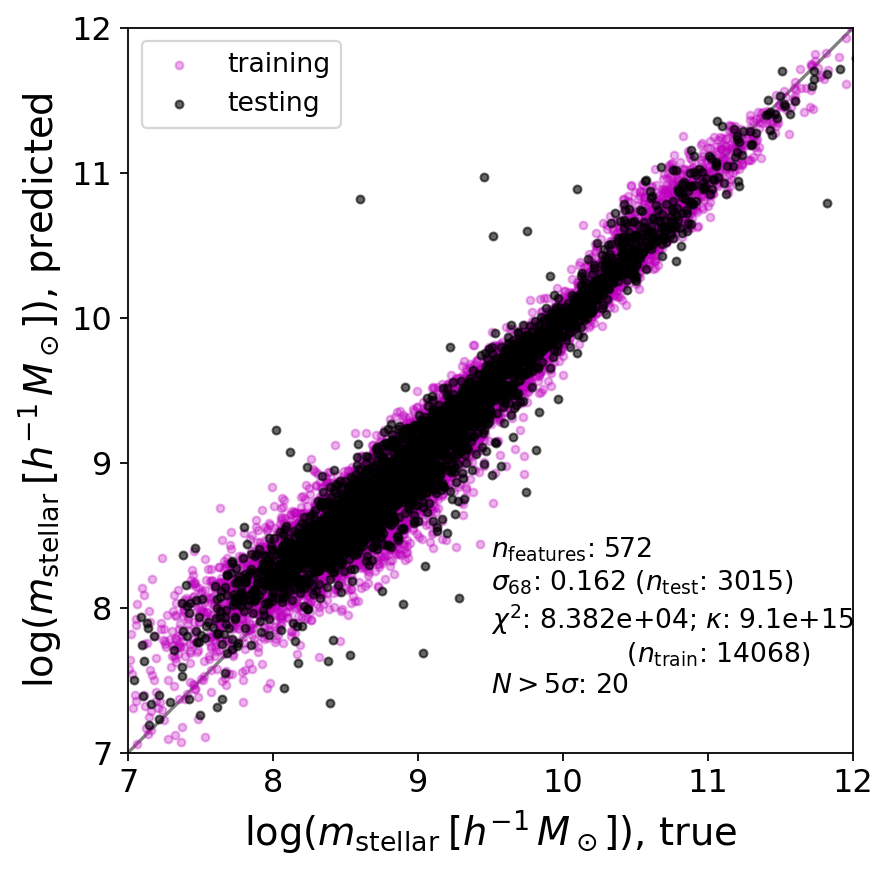

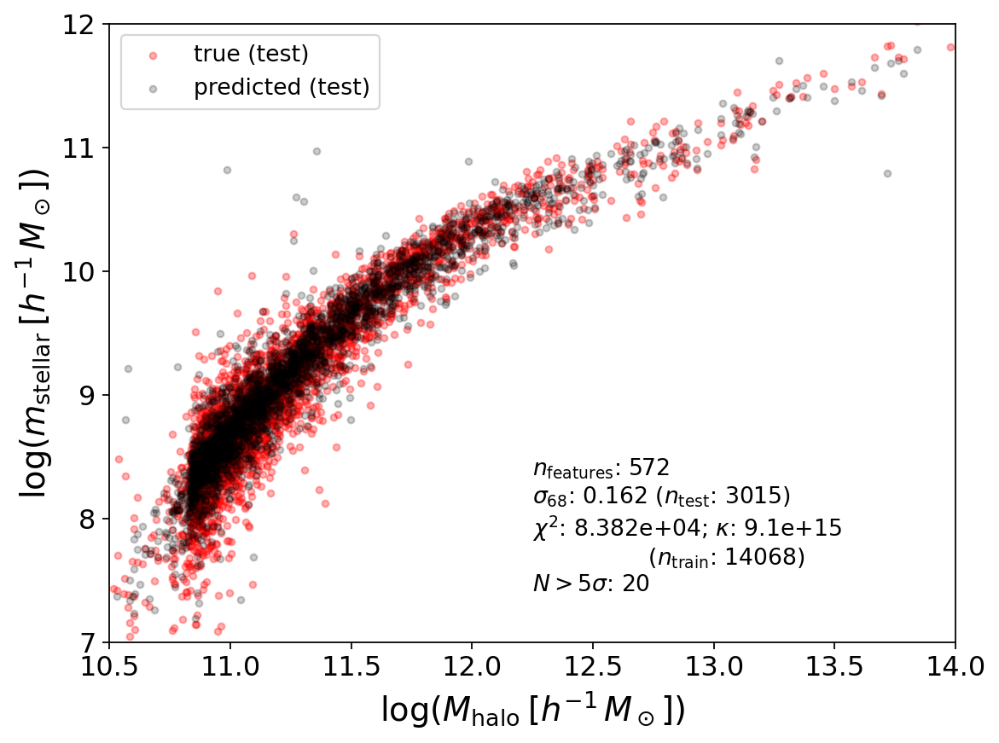

In [22]:
fitter_all = LinearFitter(scalar_featurizer.scalar_features, log_m_stellar, 
                    y_val_current_powerlaw_fit, uncertainties=uncertainties_genel2019,
                    x_features_extra=x_features_extra)
fitter_all.split_train_test(idx_train, idx_val)
fitter_all.scale_and_fit(rms_x=True, log_x=False, log_y=False)
fitter_all.predict_test()
plotter.plot_fits(x_label_name, y_label_name, fitter_all, log_m_200m)

In [23]:
chi2_all = fitter_all.chi2
error_all, n_outliers_all = utils.compute_error(fitter_all, test_error_type='percentile')
print(error_all)

0.1621999157022853


## Check out outliers

In [24]:
sim_reader.add_catalog_property_to_halos('r200m')
sim_reader.add_catalog_property_to_halos('x_minPE')
sim_reader.add_catalog_property_to_halos('x_minPE_hydro')
features_all = scalar_featurizer.scalar_features
feature_arr_all = scalar_featurizer.scalar_feature_arr

In [25]:
diffs_all = fitter_all.y_scalar_pred - fitter_all.y_scalar_test
percentile_16 = np.percentile(diffs_all, 16, axis=0)
percentile_84 = np.percentile(diffs_all, 84, axis=0)
error_inner68_test = (percentile_84-percentile_16)/2
n_outliers = len(diffs_all[diffs_all > 5*error_inner68_test])
print(n_outliers)

idxs_outliers = np.where(diffs_all > 5*error_inner68_test)[0]

20


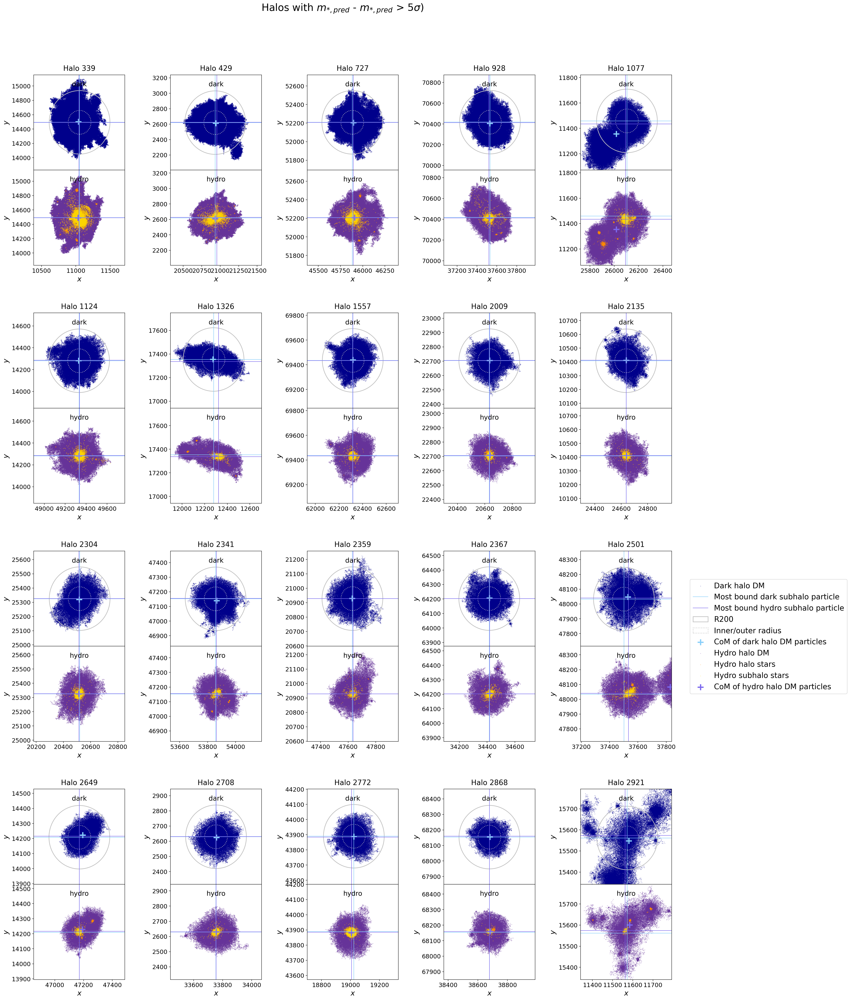

In [26]:
ncols = 5
nrows = 4
title_plot = r'Halos with $m_{*,pred}$ - $m_{*,pred}$ > 5$\sigma$)'

idxs_halos = idxs_outliers[:(nrows*ncols)]
halos = sim_reader.dark_halo_arr[idxs_halos]
titles = [f'Halo {idx_halo}' for idx_halo in idxs_halos]
plotter.plot_halos_dark_and_hydro(halos, sim_reader.base_path_dark, sim_reader.base_path_hydro, sim_reader.snap_num,
                             nrows, ncols, titles, title=title_plot)

# Feature importance

## Manual check of first most important

In [27]:
N_feat = features_all.shape[1]
idxs_feats_remaining = np.array(list(range(N_feat)))

groups = []
idxs_ordered_best = []
errors_best = []
chi2s_best = []

errors = np.full(N_feat, np.inf)
chi2s = np.full(N_feat, np.inf)
  
for idx in idxs_feats_remaining:

    idxs_to_use = np.append(np.array(idxs_ordered_best, dtype=int), idx)
    features = features_all[:,idxs_to_use]
    #display(Markdown(scalar_name(feature_arr_all[0][idx], geo_feature_arr_pseudo)))
    fitter = LinearFitter(features, log_m_stellar, 
                        y_val_current_powerlaw_fit, uncertainties=uncertainties_genel2019,
                        x_features_extra=x_features_extra)
    fitter.split_train_test(idx_train, idx_val)
    fitter.scale_and_fit(rms_x=True, log_x=False, log_y=False)
    fitter.predict_test()

    error, n_outliers = utils.compute_error(fitter, test_error_type='percentile')
    errors[idx] = error
    chi2s[idx] = fitter.chi2

In [28]:
print("First few")
n_lowest = 10
idxs_lowest_err = np.argsort(errors)
for idx in idxs_lowest_err[:n_lowest]:
    display(errors[idx], Markdown(scalar_name(feature_arr_all[0][idx], geo_feature_arr_pseudo)))

First few


0.18584134837501778

$\lambda_3\left(C^{vv}_0\right)$

0.1882484765503682

$m_0 \, \lambda_3\left(C^{vv}_0\right)$

0.1883057963638441

$\lambda_3\left(C^{vv}_0\right) \, \lambda_3\left(C^{vv}_0\right)$

0.19119949484663107

$\lambda_2\left(C^{vv}_0\right) \, \lambda_3\left(C^{xx}_0\right)$

0.19127737719973137

$\lambda_3\left(C^{vv}_0\right) \, \lambda_2\left(C^{vv}_0\right)$

0.19141116393833585

$\lambda_3\left(C^{vv}_0\right) \, \lambda_2\left(C^{xx}_0\right)$

0.1943128348814745

$[C^{xx}_0]_{jk} \, [C^{xx}_1]_{jk}$

0.1943379913160919

$m_0 \, \lambda_2\left(C^{vv}_0\right)$

0.19551406754871747

$\lambda_3\left(C^{vv}_0\right) \, \lambda_3\left(C^{xx}_0\right)$

0.19637069517643907

$\lambda_2\left(C^{vv}_0\right)$

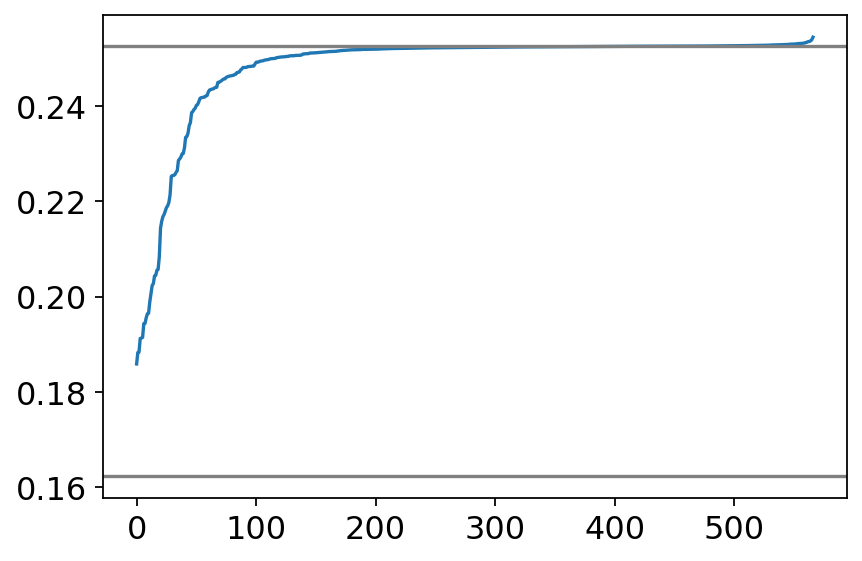

In [29]:
plt.plot(sorted(errors))
plt.axhline(error_powerlawMRV, color='grey')
plt.axhline(error_all, color='grey', label='fit with all features')

## Load in full feature importance

In [30]:
feature_imp_dir = f'../data/feature_importance/feature_importance_{sim_name}'
feature_tag = '_mstellar'
fn_feature_imp = f'{feature_imp_dir}/feature_importance{halo_tag}{geo_tag}{scalar_tag}{feature_tag}.npy'
feature_imp_results = feature_importance.load_feature_importance(fn_feature_imp)
idxs_ordered_best, errors_best, chi2s_best, groups = feature_imp_results

In [31]:
for i, idx in enumerate(idxs_ordered_best):
    display(Markdown(f'{i}: {errors_best[i]:.8f}: {scalar_name(s_feats[idx], geo_feature_arr_pseudo)}'))

0: 0.18584135: $\lambda_3\left(C^{vv}_0\right)$

1: 0.17498796: $\lambda_1\left(C^{xx}_0\right) \, m_1$

2: 0.17254716: $[C^{xx}_1]_{jk} \, [C^{xx}_1]_{jk}$

3: 0.17071254: $\lambda_3\left(C^{vv}_0\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right)$

4: 0.17020408: $\lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

5: 0.16976258: $\lambda_3\left(C^{vv}_1\right) \, \lambda_3\left(C^{xx}_1\right)$

6: 0.16957321: $m_0 \, \lambda_2\left(C^{xx}_1\right)$

7: 0.16926917: $\lambda_3\left(C^{vv}_1\right) \, \lambda_1\left(C^{vv}_2\right)$

8: 0.16908104: $[C^{xx}_0]_{jk} \, [C^{xx}_0]_{jk}$

9: 0.16882888: $[x_0]_{j} \, [x_1]_{j}$

10: 0.16879543: $\lambda_2\left(C^{xx}_1\right) \, \lambda_1\left(C^{xx}_1\right)$

11: 0.16877791: $\lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_3\left(C^{vv}_2\right)$

12: 0.16875513: $\lambda_1\left(C^{vv}_0\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

13: 0.16873589: $\lambda_2\left(C^{vv}_1\right)$

14: 0.16870870: $\lambda_1\left(C^{xx}_0\right) \, \lambda_1\left(C^{vv}_1\right)$

15: 0.16870122: $\lambda_2\left(C^{vv}_1\right) \, \lambda_3\left(C^{vv}_2\right)$

16: 0.16869317: $\lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

17: 0.16869855: $\lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

18: 0.16870412: $[\frac{1}{2} (C^{xv}_1 - C^{vx}_1)]_{jk} \, [\frac{1}{2} (C^{xv}_2 - C^{vx}_2)]_{jk}$

19: 0.16871583: $m_2 \, \lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

20: 0.16871156: $\lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, m_2$

21: 0.16870652: $\lambda_2\left(C^{xx}_0\right) \, m_1$

22: 0.16864236: $\lambda_1\left(C^{vv}_0\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

23: 0.16861863: $\lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

24: 0.16858390: $\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_1\left(C^{vv}_1\right)$

25: 0.16858411: $\lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_1\left(C^{vv}_1\right)$

26: 0.16862171: $[x_1]_{j} \, [v_2]_{j}$

27: 0.16866273: $\lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_2\left(C^{xx}_0\right)$

28: 0.16867075: $\lambda_2\left(C^{vv}_1\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

29: 0.16881209: $\lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_2\left(C^{xx}_2\right)$

30: 0.16873219: $\lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

31: 0.16870287: $[\frac{1}{2} (C^{xv}_0 + C^{vx}_0)]_{jk} \, [\frac{1}{2} (C^{xv}_0 + C^{vx}_0)]_{jk}$

32: 0.16868384: $[C^{vv}_0]_{jk} \, [C^{xx}_0]_{jk}$

33: 0.16867119: $\lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, m_2$

34: 0.16865561: $\lambda_1\left(C^{vv}_1\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

35: 0.16864020: $\lambda_1\left(C^{xx}_1\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

36: 0.16865108: $\lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

37: 0.16876019: $\lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_1\left(C^{xx}_2\right)$

38: 0.16861647: $\lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_3\left(C^{xx}_2\right)$

39: 0.16850231: $[x_0]_{j} \, [v_1]_{j}$

40: 0.16854542: $[x_0]_{j} \, [v_2]_{j}$

41: 0.16846175: $\lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right) \, \lambda_2\left(C^{xx}_2\right)$

42: 0.16847820: $[C^{vv}_1]_{jk} \, [\frac{1}{2} (C^{xv}_1 + C^{vx}_1)]_{jk}$

43: 0.16851511: $\lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, m_2$

44: 0.16851055: $\lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_1\left(C^{xx}_2\right)$

45: 0.16851595: $\lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_1\left(C^{xx}_2\right)$

46: 0.16845544: $\lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_3\left(C^{vv}_2\right)$

47: 0.16841096: $[v_1]_{j} \, [x_2]_{j}$

48: 0.16840767: $\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_2\left(C^{vv}_1\right)$

49: 0.16843381: $\lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_3\left(C^{vv}_2\right)$

50: 0.16848801: $\lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

51: 0.16847531: $\lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, m_2$

52: 0.16849803: $\lambda_2\left(C^{vv}_1\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

53: 0.16865179: $\lambda_2\left(C^{xx}_0\right) \, \lambda_1\left(C^{xx}_1\right)$

54: 0.16878350: $\lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_1\left(C^{xx}_1\right)$

55: 0.16887128: $\lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_3\left(C^{xx}_2\right)$

56: 0.16899953: $\lambda_3\left(C^{xx}_1\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

57: 0.16874579: $\lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_3\left(C^{xx}_0\right)$

58: 0.16870190: $\lambda_3\left(C^{xx}_0\right) \, \lambda_1\left(C^{xx}_1\right)$

59: 0.16877793: $\lambda_3\left(C^{vv}_2\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

60: 0.16888158: $[v_0]_{j} \, [x_0]_{j}$

61: 0.16906270: $\lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_1\left(C^{xx}_2\right)$

62: 0.16896934: $\lambda_3\left(C^{vv}_1\right) \, \lambda_2\left(C^{vv}_2\right)$

63: 0.16889088: $[C^{xx}_2]_{jk} \, [C^{xx}_2]_{jk}$

64: 0.16893725: $\lambda_3\left(C^{vv}_0\right) \, \lambda_1\left(C^{vv}_1\right)$

65: 0.16906521: $m_1 \, \lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

66: 0.16905656: $\lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_2\left(C^{xx}_2\right)$

67: 0.16904938: $\lambda_2\left(C^{vv}_0\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right)$

68: 0.16884730: $m_1 \, \lambda_2\left(C^{xx}_1\right)$

69: 0.16885835: $\lambda_2\left(C^{xx}_0\right) \, \lambda_1\left(C^{vv}_1\right)$

70: 0.16887703: $\lambda_2\left(C^{xx}_2\right) \, \lambda_2\left(C^{xx}_2\right)$

71: 0.16889304: $\lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

72: 0.16894589: $\lambda_2\left(C^{vv}_0\right) \, \lambda_3\left(C^{xx}_1\right)$

73: 0.16896657: $\lambda_3\left(C^{vv}_0\right) \, \lambda_3\left(C^{vv}_1\right)$

74: 0.16870917: $\lambda_2\left(C^{vv}_0\right) \, \lambda_1\left(C^{xx}_1\right)$

75: 0.16822604: $\lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_1\left(C^{xx}_1\right)$

76: 0.16786759: $\lambda_2\left(C^{xx}_1\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

77: 0.16768905: $\lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

78: 0.16765687: $\lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right) \, \lambda_1\left(C^{xx}_2\right)$

79: 0.16757916: $\lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

80: 0.16750341: $\lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

81: 0.16746377: $\lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

82: 0.16757487: $\lambda_1\left(C^{vv}_0\right) \, \lambda_1\left(C^{xx}_0\right)$

83: 0.16759609: $\lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_1\left(C^{xx}_2\right)$

84: 0.16760444: $\lambda_1\left(C^{vv}_0\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

85: 0.16756904: $\lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_2\left(C^{xx}_2\right)$

86: 0.16763887: $\lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_3\left(C^{xx}_1\right)$

87: 0.16772562: $\lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right) \, \lambda_3\left(C^{xx}_2\right)$

88: 0.16773255: $\lambda_1\left(C^{vv}_1\right) \, \lambda_3\left(C^{vv}_2\right)$

89: 0.16773595: $[\frac{1}{2} (C^{xv}_0 + C^{vx}_0)]_{jk} \, [C^{vv}_1]_{jk}$

90: 0.16791805: $\lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, m_1$

91: 0.16791194: $\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_3\left(C^{xx}_1\right)$

92: 0.16778674: $\lambda_2\left(C^{vv}_0\right) \, \lambda_3\left(C^{vv}_1\right)$

93: 0.16776648: $\lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_2\left(C^{xx}_1\right)$

94: 0.16787709: $\lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right)$

95: 0.16806998: $\lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

96: 0.16805801: $m_2 \, \lambda_2\left(C^{xx}_2\right)$

97: 0.16785555: $\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

98: 0.16785347: $\lambda_1\left(C^{xx}_0\right) \, \lambda_2\left(C^{xx}_2\right)$

99: 0.16791344: $[v_0]_{j} \, [x_1]_{j}$

100: 0.16791353: $\lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

101: 0.16793824: $m_1 \, \lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

102: 0.16792955: $\lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_2\left(C^{xx}_1\right)$

103: 0.16796431: $\lambda_3\left(C^{xx}_1\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

104: 0.16784041: $m_1 \, \lambda_2\left(C^{xx}_2\right)$

105: 0.16812508: $\lambda_2\left(C^{vv}_0\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

106: 0.16813097: $\lambda_1\left(C^{vv}_0\right) \, \lambda_3\left(C^{vv}_1\right)$

107: 0.16799889: $\lambda_3\left(C^{vv}_1\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

108: 0.16792828: $\lambda_2\left(C^{xx}_1\right) \, \lambda_2\left(C^{xx}_2\right)$

109: 0.16792850: $\lambda_3\left(C^{vv}_0\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

110: 0.16793763: $\lambda_1\left(C^{xx}_0\right) \, \lambda_2\left(C^{vv}_1\right)$

111: 0.16779489: $\lambda_1\left(C^{vv}_1\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

112: 0.16756387: $\lambda_2\left(C^{vv}_0\right) \, \lambda_1\left(C^{vv}_1\right)$

113: 0.16755419: $\lambda_1\left(C^{xx}_0\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

114: 0.16771056: $\lambda_3\left(C^{xx}_1\right) \, \lambda_2\left(C^{xx}_2\right)$

115: 0.16784397: $\lambda_3\left(C^{xx}_0\right) \, \lambda_3\left(C^{xx}_0\right)$

116: 0.16786420: $\lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_2\left(C^{xx}_2\right)$

117: 0.16797169: $\lambda_1\left(C^{vv}_1\right)$

118: 0.16774830: $\lambda_3\left(C^{vv}_1\right) \, \lambda_3\left(C^{vv}_2\right)$

119: 0.16744256: $\lambda_2\left(C^{xx}_0\right) \, \lambda_1\left(C^{xx}_0\right)$

120: 0.16693310: $\lambda_3\left(C^{vv}_1\right) \, \lambda_1\left(C^{xx}_1\right)$

121: 0.16700271: $\lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

122: 0.16712603: $\lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

123: 0.16711104: $\lambda_2\left(C^{xx}_0\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

124: 0.16693493: $\lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_2\left(C^{xx}_2\right)$

125: 0.16692838: $\lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_2\left(C^{vv}_2\right)$

126: 0.16722174: $\lambda_3\left(C^{xx}_0\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

127: 0.16722288: $\lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

128: 0.16715127: $[C^{vv}_0]_{jk} \, [\frac{1}{2} (C^{xv}_1 + C^{vx}_1)]_{jk}$

129: 0.16721114: $\lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

130: 0.16719474: $\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_2\left(C^{xx}_1\right)$

131: 0.16733061: $\lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

132: 0.16767333: $[v_1]_{j} \, [x_1]_{j}$

133: 0.16755106: $\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

134: 0.16750969: $\lambda_3\left(C^{vv}_1\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

135: 0.16732076: $\lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

136: 0.16733163: $\lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_2\left(C^{xx}_1\right)$

137: 0.16709534: $\lambda_2\left(C^{vv}_1\right) \, \lambda_1\left(C^{xx}_1\right)$

138: 0.16719481: $m_0 \, \lambda_1\left(C^{xx}_1\right)$

139: 0.16726797: $[\frac{1}{2} (C^{xv}_0 + C^{vx}_0)]_{jk} \, [\frac{1}{2} (C^{xv}_2 + C^{vx}_2)]_{jk}$

140: 0.16702177: $\lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_3\left(C^{vv}_1\right)$

141: 0.16709562: $\lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_3\left(C^{xx}_1\right)$

142: 0.16668369: $\lambda_2\left(C^{xx}_1\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

143: 0.16666932: $\lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

144: 0.16667582: $\lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

145: 0.16666693: $\lambda_2\left(C^{xx}_0\right) \, \lambda_2\left(C^{vv}_1\right)$

146: 0.16667620: $\lambda_3\left(C^{vv}_1\right) \, \lambda_2\left(C^{xx}_2\right)$

147: 0.16686556: $[\frac{1}{2} (C^{xv}_0 - C^{vx}_0)]_{jk} \, [\frac{1}{2} (C^{xv}_2 - C^{vx}_2)]_{jk}$

148: 0.16672789: $\lambda_2\left(C^{vv}_1\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

149: 0.16654898: $\lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_2\left(C^{vv}_1\right)$

150: 0.16670127: $\lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_3\left(C^{xx}_1\right)$

151: 0.16680046: $[\frac{1}{2} (C^{xv}_1 + C^{vx}_1)]_{jk} \, [C^{vv}_2]_{jk}$

152: 0.16688978: $\lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

153: 0.16646193: $\lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_1\left(C^{vv}_2\right)$

154: 0.16649692: $\lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_1\left(C^{vv}_2\right)$

155: 0.16661689: $[v_1]_{j} \, [v_1]_{j}$

156: 0.16664788: $\lambda_2\left(C^{vv}_1\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

157: 0.16674730: $\lambda_2\left(C^{vv}_0\right) \, \lambda_2\left(C^{vv}_1\right)$

158: 0.16665703: $\lambda_1\left(C^{xx}_1\right)$

159: 0.16629416: $\lambda_3\left(C^{xx}_0\right) \, \lambda_2\left(C^{xx}_1\right)$

160: 0.16631398: $m_2 \, \lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

161: 0.16631226: $[x_2]_{j} \, [x_2]_{j}$

162: 0.16632893: $\lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right) \, \lambda_1\left(C^{xx}_2\right)$

163: 0.16643158: $[\frac{1}{2} (C^{xv}_0 + C^{vx}_0)]_{jk} \, [C^{xx}_1]_{jk}$

164: 0.16648820: $[C^{xx}_0]_{jk} \, [C^{vv}_1]_{jk}$

165: 0.16606611: $\lambda_3\left(C^{vv}_1\right) \, \lambda_2\left(C^{xx}_1\right)$

166: 0.16613206: $\lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_1\left(C^{vv}_2\right)$

167: 0.16592795: $\lambda_3\left(C^{xx}_1\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

168: 0.16573552: $\lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

169: 0.16564240: $\lambda_2\left(C^{vv}_1\right) \, \lambda_1\left(C^{vv}_2\right)$

170: 0.16567098: $\lambda_3\left(C^{xx}_0\right)$

171: 0.16577719: $m_2 \, m_2$

172: 0.16572166: $\lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_3\left(C^{xx}_2\right)$

173: 0.16558966: $\lambda_2\left(C^{xx}_1\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

174: 0.16538860: $\lambda_3\left(C^{xx}_0\right) \, \lambda_1\left(C^{vv}_1\right)$

175: 0.16554658: $\lambda_2\left(C^{xx}_1\right) \, \lambda_3\left(C^{vv}_2\right)$

176: 0.16526289: $\lambda_3\left(C^{xx}_1\right) \, \lambda_2\left(C^{vv}_2\right)$

177: 0.16541079: $\lambda_3\left(C^{xx}_0\right) \, \lambda_2\left(C^{vv}_1\right)$

178: 0.16577435: $\lambda_2\left(C^{vv}_1\right) \, \lambda_1\left(C^{xx}_2\right)$

179: 0.16541738: $\lambda_3\left(C^{vv}_1\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

180: 0.16541428: $\lambda_2\left(C^{vv}_1\right) \, m_2$

181: 0.16553851: $\lambda_1\left(C^{xx}_1\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

182: 0.16570546: $m_2 \, \lambda_1\left(C^{xx}_2\right)$

183: 0.16568193: $\lambda_3\left(C^{vv}_2\right) \, \lambda_3\left(C^{vv}_2\right)$

184: 0.16582158: $\lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

185: 0.16575555: $\lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_3\left(C^{xx}_2\right)$

186: 0.16562884: $\lambda_2\left(C^{vv}_1\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

187: 0.16549694: $[\frac{1}{2} (C^{xv}_1 + C^{vx}_1)]_{jk} \, [\frac{1}{2} (C^{xv}_2 + C^{vx}_2)]_{jk}$

188: 0.16554001: $m_1 \, \lambda_3\left(C^{xx}_2\right)$

189: 0.16553053: $\lambda_2\left(C^{xx}_1\right) \, \lambda_3\left(C^{xx}_2\right)$

190: 0.16600145: $\lambda_3\left(C^{vv}_2\right) \, \lambda_1\left(C^{xx}_2\right)$

191: 0.16564899: $m_2 \, \lambda_3\left(C^{vv}_2\right)$

192: 0.16556989: $\lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

193: 0.16581268: $\lambda_3\left(C^{xx}_1\right) \, \lambda_1\left(C^{vv}_2\right)$

194: 0.16588627: $\lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

195: 0.16586729: $\lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_1\left(C^{vv}_2\right)$

196: 0.16586729: $[\frac{1}{2} (C^{xv}_1 + C^{vx}_1)]_{jk} \, [\frac{1}{2} (C^{xv}_1 + C^{vx}_1)]_{jk}$

197: 0.16612663: $\lambda_1\left(C^{vv}_0\right) \, \lambda_2\left(C^{vv}_1\right)$

198: 0.16600846: $\lambda_2\left(C^{xx}_1\right) \, \lambda_2\left(C^{xx}_1\right)$

199: 0.16647238: $\lambda_1\left(C^{xx}_0\right) \, \lambda_3\left(C^{xx}_2\right)$

200: 0.16639098: $\lambda_3\left(C^{vv}_1\right) \, \lambda_1\left(C^{xx}_2\right)$

201: 0.16663154: $\lambda_2\left(C^{vv}_0\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

202: 0.16631949: $\lambda_2\left(C^{vv}_0\right) \, \lambda_3\left(C^{xx}_0\right)$

203: 0.16606378: $[\frac{1}{2} (C^{xv}_0 - C^{vx}_0)]_{jk} \, [\frac{1}{2} (C^{xv}_0 - C^{vx}_0)]_{jk}$

204: 0.16427042: $\lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

205: 0.16354933: $\lambda_1\left(C^{xx}_1\right) \, \lambda_2\left(C^{xx}_2\right)$

206: 0.16348523: $[C^{vv}_0]_{jk} \, [\frac{1}{2} (C^{xv}_2 + C^{vx}_2)]_{jk}$

207: 0.16348687: $\lambda_3\left(C^{vv}_0\right) \, \lambda_1\left(C^{xx}_1\right)$

208: 0.16350342: $\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right)$

209: 0.16379363: $\lambda_3\left(C^{vv}_0\right) \, \lambda_3\left(C^{xx}_1\right)$

210: 0.16360824: $m_1 \, \lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

211: 0.16346584: $\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_2\left(C^{xx}_2\right)$

212: 0.16333823: $\lambda_2\left(C^{xx}_0\right) \, \lambda_3\left(C^{xx}_2\right)$

213: 0.16334873: $\lambda_1\left(C^{xx}_1\right) \, \lambda_1\left(C^{vv}_2\right)$

214: 0.16334176: $\lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right) \, \lambda_1\left(C^{xx}_2\right)$

215: 0.16346133: $[\frac{1}{2} (C^{xv}_0 + C^{vx}_0)]_{jk} \, [C^{xx}_0]_{jk}$

216: 0.16333558: $\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_1\left(C^{xx}_0\right)$

217: 0.16372539: $\lambda_3\left(C^{vv}_0\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right)$

218: 0.16375428: $\lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_3\left(C^{vv}_2\right)$

219: 0.16391159: $\lambda_3\left(C^{vv}_0\right) \, \lambda_3\left(C^{xx}_0\right)$

220: 0.16377786: $\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, m_2$

221: 0.16373676: $\lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_3\left(C^{xx}_2\right)$

222: 0.16367287: $[C^{vv}_1]_{jk} \, [C^{xx}_2]_{jk}$

223: 0.16317012: $\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right)$

224: 0.16296621: $\lambda_3\left(C^{xx}_1\right) \, \lambda_3\left(C^{xx}_2\right)$

225: 0.16254291: $\lambda_2\left(C^{vv}_0\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right)$

226: 0.16232248: $\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_3\left(C^{vv}_2\right)$

227: 0.16232670: $[\frac{1}{2} (C^{xv}_0 + C^{vx}_0)]_{jk} \, [\frac{1}{2} (C^{xv}_1 + C^{vx}_1)]_{jk}$

228: 0.16222534: $[x_0]_{j} \, [x_2]_{j}$

229: 0.16195596: $\lambda_2\left(C^{xx}_1\right) \, \lambda_1\left(C^{vv}_2\right)$

230: 0.16195620: $\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right)$

231: 0.16194466: $\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_3\left(C^{xx}_0\right)$

232: 0.16195808: $m_0 \, \lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right)$

233: 0.16192374: $\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_2\left(C^{xx}_0\right)$

234: 0.16233474: $\lambda_1\left(C^{vv}_2\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

235: 0.16230682: $\lambda_2\left(C^{xx}_1\right) \, \lambda_2\left(C^{vv}_2\right)$

236: 0.16229505: $\lambda_3\left(C^{vv}_1\right) \, \lambda_3\left(C^{xx}_2\right)$

237: 0.16229121: $m_2 \, \lambda_3\left(C^{xx}_2\right)$

238: 0.16232903: $[C^{xx}_1]_{jk} \, [\frac{1}{2} (C^{xv}_2 + C^{vx}_2)]_{jk}$

239: 0.16223092: $\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

240: 0.16217851: $\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, m_1$

241: 0.16218075: $\lambda_2\left(C^{xx}_1\right) \, \lambda_1\left(C^{xx}_2\right)$

242: 0.16198773: $\lambda_3\left(C^{xx}_1\right) \, \lambda_1\left(C^{xx}_1\right)$

243: 0.16198890: $\lambda_1\left(C^{xx}_0\right) \, \lambda_1\left(C^{xx}_2\right)$

244: 0.16200042: $m_0$

245: 0.16163413: $m_1 \, \lambda_1\left(C^{xx}_1\right)$

246: 0.16120606: $\lambda_2\left(C^{xx}_0\right) \, \lambda_2\left(C^{xx}_2\right)$

247: 0.16109759: $\lambda_3\left(C^{xx}_0\right) \, \lambda_2\left(C^{xx}_2\right)$

248: 0.16102153: $\lambda_1\left(C^{xx}_0\right) \, \lambda_1\left(C^{xx}_1\right)$

249: 0.16094487: $[x_1]_{j} \, [x_2]_{j}$

250: 0.16094271: $[C^{xx}_0]_{jk} \, [C^{xx}_2]_{jk}$

251: 0.16096057: $\lambda_2\left(C^{xx}_0\right) \, \lambda_1\left(C^{xx}_2\right)$

252: 0.16102059: $\lambda_2\left(C^{xx}_0\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

253: 0.16093482: $\lambda_2\left(C^{vv}_0\right)$

254: 0.16100397: $\lambda_3\left(C^{xx}_1\right) \, \lambda_1\left(C^{xx}_2\right)$

255: 0.16107545: $\lambda_1\left(C^{xx}_0\right) \, \lambda_3\left(C^{xx}_1\right)$

256: 0.16091064: $\lambda_3\left(C^{vv}_2\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

257: 0.16079850: $[\frac{1}{2} (C^{xv}_0 + C^{vx}_0)]_{jk} \, [C^{xx}_2]_{jk}$

258: 0.16080992: $\lambda_3\left(C^{xx}_0\right) \, \lambda_1\left(C^{xx}_2\right)$

259: 0.16094420: $m_1 \, \lambda_2\left(C^{vv}_2\right)$

260: 0.16098789: $\lambda_1\left(C^{xx}_0\right) \, \lambda_2\left(C^{xx}_1\right)$

261: 0.16100708: $m_1 \, \lambda_1\left(C^{xx}_2\right)$

262: 0.16117171: $\lambda_3\left(C^{xx}_1\right) \, \lambda_3\left(C^{vv}_2\right)$

263: 0.16091522: $\lambda_2\left(C^{vv}_2\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

264: 0.16113425: $\lambda_2\left(C^{xx}_0\right) \, \lambda_2\left(C^{xx}_1\right)$

265: 0.16121208: $[C^{xx}_1]_{jk} \, [C^{xx}_2]_{jk}$

266: 0.16148271: $\lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right) \, \lambda_3\left(C^{xx}_2\right)$

267: 0.16150359: $\lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right) \, \lambda_2\left(C^{xx}_2\right)$

268: 0.16152318: $m_1 \, \lambda_1\left(C^{vv}_2\right)$

269: 0.16156761: $\lambda_3\left(C^{xx}_2\right) \, \lambda_2\left(C^{xx}_2\right)$

270: 0.16157518: $\lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, m_2$

271: 0.16163737: $m_1 \, \lambda_3\left(C^{vv}_1\right)$

272: 0.16163118: $[C^{vv}_2]_{jk} \, [C^{xx}_2]_{jk}$

273: 0.16182271: $\lambda_1\left(C^{xx}_1\right) \, \lambda_3\left(C^{xx}_2\right)$

274: 0.16178205: $\lambda_3\left(C^{vv}_2\right) \, \lambda_3\left(C^{xx}_2\right)$

275: 0.16200924: $\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_3\left(C^{xx}_2\right)$

276: 0.16201957: $\lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right) \, \lambda_2\left(C^{xx}_2\right)$

277: 0.16239492: $m_1 \, m_1$

278: 0.16218621: $\lambda_1\left(C^{vv}_1\right) \, \lambda_1\left(C^{vv}_1\right)$

279: 0.16218377: $\lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_2\left(C^{vv}_2\right)$

280: 0.16220894: $\lambda_1\left(C^{vv}_0\right) \, \lambda_3\left(C^{xx}_1\right)$

281: 0.16234554: $\lambda_1\left(C^{xx}_1\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

282: 0.16256424: $[C^{xx}_0]_{jk} \, [C^{xx}_1]_{jk}$

283: 0.16235551: $[v_0]_{j} \, [v_0]_{j}$

284: 0.16134566: $\lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_2\left(C^{vv}_1\right)$

285: 0.16080630: $\lambda_2\left(C^{xx}_1\right)$

286: 0.16020023: $m_1 \, m_2$

287: 0.15994053: $m_1 \, \lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

288: 0.15966602: $[C^{vv}_1]_{jk} \, [C^{xx}_1]_{jk}$

289: 0.15959505: $\lambda_3\left(C^{xx}_0\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

290: 0.15942755: $\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right)$

291: 0.15935451: $m_2 \, \lambda_2\left(C^{vv}_2\right)$

292: 0.15900603: $\lambda_3\left(C^{xx}_0\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

293: 0.15896924: $m_0 \, \lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

294: 0.15894852: $\lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_2\left(C^{xx}_1\right)$

295: 0.15894291: $\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_3\left(C^{vv}_1\right)$

296: 0.15893792: $[\frac{1}{2} (C^{xv}_1 + C^{vx}_1)]_{jk} \, [C^{xx}_2]_{jk}$

297: 0.15894007: $\lambda_2\left(C^{vv}_1\right) \, \lambda_2\left(C^{xx}_2\right)$

298: 0.15894666: $\lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_2\left(C^{vv}_2\right)$

299: 0.15897149: $[C^{xx}_0]_{jk} \, [\frac{1}{2} (C^{xv}_2 + C^{vx}_2)]_{jk}$

300: 0.15891708: $\lambda_2\left(C^{vv}_0\right) \, \lambda_2\left(C^{xx}_0\right)$

301: 0.15870377: $\lambda_1\left(C^{xx}_1\right) \, \lambda_1\left(C^{xx}_2\right)$

302: 0.15858502: $m_0 \, \lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

303: 0.15851278: $\lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_2\left(C^{xx}_1\right)$

304: 0.15844312: $\lambda_1\left(C^{vv}_0\right)$

305: 0.15842682: $\lambda_1\left(C^{vv}_1\right) \, \lambda_2\left(C^{xx}_1\right)$

306: 0.15841751: $\lambda_1\left(C^{xx}_1\right) \, m_2$

307: 0.15843193: $\lambda_2\left(C^{vv}_1\right) \, \lambda_3\left(C^{xx}_2\right)$

308: 0.15845095: $\lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_1\left(C^{vv}_1\right)$

309: 0.15833333: $\lambda_1\left(C^{vv}_0\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right)$

310: 0.15819216: $[C^{vv}_1]_{jk} \, [\frac{1}{2} (C^{xv}_2 + C^{vx}_2)]_{jk}$

311: 0.15814458: $\lambda_1\left(C^{xx}_0\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

312: 0.15806226: $\lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_3\left(C^{xx}_1\right)$

313: 0.15822068: $\lambda_3\left(C^{vv}_0\right) \, \lambda_2\left(C^{xx}_0\right)$

314: 0.15824599: $\lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_2\left(C^{xx}_0\right)$

315: 0.15811436: $\lambda_2\left(C^{xx}_0\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

316: 0.15797657: $\lambda_3\left(C^{xx}_1\right) \, m_2$

317: 0.15803542: $\lambda_2\left(C^{xx}_0\right) \, m_2$

318: 0.15816341: $\lambda_2\left(C^{vv}_1\right) \, \lambda_2\left(C^{vv}_2\right)$

319: 0.15821421: $\lambda_3\left(C^{vv}_1\right) \, m_2$

320: 0.15842815: $\lambda_1\left(C^{xx}_1\right) \, \lambda_3\left(C^{vv}_2\right)$

321: 0.15825548: $\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

322: 0.15812423: $\lambda_1\left(C^{vv}_1\right) \, \lambda_2\left(C^{vv}_2\right)$

323: 0.15815639: $\lambda_3\left(C^{vv}_0\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

324: 0.15817416: $\lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_1\left(C^{xx}_0\right)$

325: 0.15789630: $\lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

326: 0.15810866: $\lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, m_1$

327: 0.15812404: $\lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_1\left(C^{xx}_1\right)$

328: 0.15816454: $\lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_1\left(C^{xx}_1\right)$

329: 0.15821025: $\lambda_1\left(C^{xx}_0\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

330: 0.15782476: $\lambda_3\left(C^{xx}_0\right) \, \lambda_3\left(C^{xx}_1\right)$

331: 0.15768045: $\lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

332: 0.15740332: $m_0 \, \lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

333: 0.15741704: $\lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

334: 0.15752141: $m_1 \, \lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

335: 0.15765520: $\lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_3\left(C^{xx}_1\right)$

336: 0.15779497: $\lambda_1\left(C^{vv}_0\right) \, \lambda_2\left(C^{xx}_1\right)$

337: 0.15749238: $\lambda_3\left(C^{xx}_1\right) \, \lambda_3\left(C^{xx}_1\right)$

338: 0.15732553: $\lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

339: 0.15710132: $\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

340: 0.15710132: $\lambda_1\left(C^{xx}_1\right) \, \lambda_1\left(C^{xx}_1\right)$

341: 0.15714906: $\lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_3\left(C^{vv}_1\right)$

342: 0.15738697: $\lambda_3\left(C^{xx}_1\right) \, \lambda_2\left(C^{xx}_1\right)$

343: 0.15761694: $\lambda_1\left(C^{xx}_0\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

344: 0.15737407: $m_0 \, m_0$

345: 0.15735371: $[x_0]_{j} \, [x_0]_{j}$

346: 0.15718401: $\lambda_3\left(C^{vv}_1\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

347: 0.15704675: $[\frac{1}{2} (C^{xv}_2 + C^{vx}_2)]_{jk} \, [C^{xx}_2]_{jk}$

348: 0.15707786: $[\frac{1}{2} (C^{xv}_1 + C^{vx}_1)]_{jk} \, [C^{xx}_1]_{jk}$

349: 0.15711238: $\lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_1\left(C^{xx}_0\right)$

350: 0.15709064: $[C^{vv}_2]_{jk} \, [\frac{1}{2} (C^{xv}_2 + C^{vx}_2)]_{jk}$

351: 0.15724156: $\lambda_3\left(C^{xx}_0\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

352: 0.15746445: $\lambda_2\left(C^{xx}_1\right) \, m_2$

353: 0.15718035: $[C^{vv}_0]_{jk} \, [C^{xx}_2]_{jk}$

354: 0.15757264: $[C^{xx}_0]_{jk} \, [\frac{1}{2} (C^{xv}_1 + C^{vx}_1)]_{jk}$

355: 0.15717330: $m_0 \, \lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right)$

356: 0.15706473: $\lambda_3\left(C^{xx}_2\right) \, \lambda_3\left(C^{xx}_2\right)$

357: 0.15706473: $\lambda_1\left(C^{xx}_2\right) \, \lambda_1\left(C^{xx}_2\right)$

358: 0.15715047: $\lambda_2\left(C^{xx}_2\right) \, \lambda_1\left(C^{xx}_2\right)$

359: 0.15711437: $\lambda_3\left(C^{xx}_2\right) \, \lambda_1\left(C^{xx}_2\right)$

360: 0.15744875: $\lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_3\left(C^{xx}_0\right)$

361: 0.15712521: $\lambda_2\left(C^{xx}_0\right) \, \lambda_3\left(C^{xx}_1\right)$

362: 0.15731643: $m_0 \, \lambda_3\left(C^{xx}_1\right)$

363: 0.15724873: $\lambda_3\left(C^{xx}_1\right)$

364: 0.15795307: $\lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right)$

365: 0.15732346: $m_1 \, \lambda_3\left(C^{xx}_1\right)$

366: 0.15700704: $\lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_2\left(C^{vv}_2\right)$

367: 0.15651307: $m_1 \, \lambda_3\left(C^{vv}_2\right)$

368: 0.15642661: $\lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_1\left(C^{vv}_2\right)$

369: 0.15644825: $\lambda_1\left(C^{vv}_1\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

370: 0.15650457: $\lambda_2\left(C^{vv}_0\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right)$

371: 0.15671611: $\lambda_2\left(C^{vv}_2\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

372: 0.15669440: $\lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

373: 0.15665243: $\lambda_3\left(C^{vv}_0\right) \, \lambda_2\left(C^{xx}_1\right)$

374: 0.15706475: $\lambda_3\left(C^{vv}_0\right) \, \lambda_3\left(C^{vv}_0\right)$

375: 0.15647250: $\lambda_2\left(C^{vv}_0\right) \, \lambda_2\left(C^{xx}_1\right)$

376: 0.15646574: $\lambda_1\left(C^{vv}_1\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

377: 0.15656982: $m_0 \, \lambda_2\left(C^{vv}_0\right)$

378: 0.15657910: $\lambda_2\left(C^{vv}_0\right) \, \lambda_2\left(C^{vv}_0\right)$

379: 0.15689931: $\lambda_3\left(C^{vv}_0\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right)$

380: 0.15675614: $m_1 \, \lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

381: 0.15695393: $\lambda_3\left(C^{vv}_0\right) \, \lambda_1\left(C^{vv}_0\right)$

382: 0.15706011: $\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

383: 0.15727830: $\lambda_3\left(C^{xx}_2\right)$

384: 0.15717978: $[\frac{1}{2} (C^{xv}_0 + C^{vx}_0)]_{jk} \, [C^{vv}_2]_{jk}$

385: 0.15685741: $\lambda_2\left(C^{vv}_2\right)$

386: 0.15666830: $\lambda_3\left(C^{vv}_0\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

387: 0.15681563: $\lambda_2\left(C^{vv}_1\right) \, \lambda_2\left(C^{xx}_1\right)$

388: 0.15668884: $\lambda_2\left(C^{vv}_0\right) \, \lambda_1\left(C^{xx}_2\right)$

389: 0.15679255: $\lambda_1\left(C^{vv}_1\right) \, \lambda_3\left(C^{xx}_1\right)$

390: 0.15657018: $\lambda_3\left(C^{vv}_0\right) \, \lambda_1\left(C^{xx}_2\right)$

391: 0.15663213: $m_0 \, \lambda_1\left(C^{xx}_2\right)$

392: 0.15676930: $\lambda_1\left(C^{xx}_2\right)$

393: 0.15669669: $\lambda_2\left(C^{vv}_1\right) \, \lambda_3\left(C^{xx}_1\right)$

394: 0.15687915: $[v_0]_{j} \, [x_2]_{j}$

395: 0.15639975: $m_0 \, m_2$

396: 0.15635427: $[v_2]_{j} \, [x_2]_{j}$

397: 0.15634559: $\lambda_2\left(C^{xx}_0\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

398: 0.15637150: $\lambda_1\left(C^{xx}_0\right) \, m_2$

399: 0.15644889: $\lambda_3\left(C^{vv}_2\right) \, \lambda_1\left(C^{vv}_2\right)$

400: 0.15656869: $\lambda_1\left(C^{xx}_0\right) \, \lambda_1\left(C^{vv}_2\right)$

401: 0.15655736: $\lambda_2\left(C^{vv}_0\right) \, m_2$

402: 0.15676257: $\lambda_3\left(C^{vv}_0\right) \, \lambda_1\left(C^{vv}_2\right)$

403: 0.15663125: $\lambda_2\left(C^{xx}_2\right)$

404: 0.15695828: $\lambda_2\left(C^{xx}_0\right) \, \lambda_2\left(C^{vv}_2\right)$

405: 0.15700959: $\lambda_3\left(C^{vv}_0\right) \, m_2$

406: 0.15698613: $\lambda_3\left(C^{vv}_0\right) \, \lambda_3\left(C^{xx}_2\right)$

407: 0.15701273: $m_2$

408: 0.15738010: $m_0 \, \lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right)$

409: 0.15773392: $\lambda_3\left(C^{vv}_0\right) \, \lambda_2\left(C^{xx}_2\right)$

410: 0.15771540: $\lambda_3\left(C^{xx}_0\right) \, \lambda_3\left(C^{xx}_2\right)$

411: 0.15798440: $\lambda_2\left(C^{xx}_0\right) \, \lambda_1\left(C^{vv}_2\right)$

412: 0.15812249: $[C^{xx}_0]_{jk} \, [C^{vv}_2]_{jk}$

413: 0.15813318: $\lambda_1\left(C^{xx}_0\right) \, \lambda_2\left(C^{vv}_2\right)$

414: 0.15818047: $m_0 \, \lambda_1\left(C^{vv}_2\right)$

415: 0.15767423: $m_0 \, \lambda_2\left(C^{xx}_2\right)$

416: 0.15756414: $\lambda_2\left(C^{vv}_0\right) \, \lambda_2\left(C^{xx}_2\right)$

417: 0.15773499: $\lambda_2\left(C^{vv}_2\right) \, \lambda_1\left(C^{vv}_2\right)$

418: 0.15763268: $\lambda_2\left(C^{vv}_2\right) \, \lambda_2\left(C^{vv}_2\right)$

419: 0.15763311: $\lambda_2\left(C^{vv}_2\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

420: 0.15763546: $\lambda_2\left(C^{vv}_2\right) \, \lambda_2\left(C^{xx}_2\right)$

421: 0.15757750: $\lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_1\left(C^{xx}_1\right)$

422: 0.15777420: $\lambda_1\left(C^{vv}_2\right) \, \lambda_2\left(C^{xx}_2\right)$

423: 0.15798034: $\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_1\left(C^{vv}_2\right)$

424: 0.15791856: $\lambda_1\left(C^{xx}_0\right) \, \lambda_3\left(C^{vv}_1\right)$

425: 0.15776284: $\lambda_1\left(C^{xx}_0\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

426: 0.15776972: $\lambda_3\left(C^{vv}_1\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

427: 0.15767300: $\lambda_1\left(C^{vv}_2\right) \, \lambda_1\left(C^{vv}_2\right)$

428: 0.15767300: $[C^{vv}_2]_{jk} \, [C^{vv}_2]_{jk}$

429: 0.15768419: $m_1 \, \lambda_2\left(C^{vv}_1\right)$

430: 0.15782950: $\lambda_3\left(C^{xx}_0\right) \, \lambda_3\left(C^{vv}_1\right)$

431: 0.15789558: $\lambda_1\left(C^{vv}_2\right) \, \lambda_3\left(C^{xx}_2\right)$

432: 0.15788841: $\lambda_3\left(C^{xx}_0\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

433: 0.15772586: $\lambda_2\left(C^{vv}_0\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

434: 0.15785916: $\lambda_2\left(C^{xx}_0\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

435: 0.15799938: $\lambda_3\left(C^{vv}_0\right) \, \lambda_2\left(C^{vv}_2\right)$

436: 0.15792717: $\lambda_2\left(C^{vv}_0\right) \, \lambda_3\left(C^{xx}_2\right)$

437: 0.15795779: $\lambda_3\left(C^{vv}_2\right) \, \lambda_2\left(C^{xx}_2\right)$

438: 0.15830765: $\lambda_1\left(C^{vv}_1\right) \, m_2$

439: 0.15814367: $m_2 \, \lambda_1\left(C^{vv}_2\right)$

440: 0.15811646: $[C^{xx}_1]_{jk} \, [C^{vv}_2]_{jk}$

441: 0.15805415: $\lambda_3\left(C^{vv}_0\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

442: 0.15816124: $m_0 \, \lambda_3\left(C^{xx}_2\right)$

443: 0.15820799: $\lambda_1\left(C^{xx}_0\right) \, \lambda_3\left(C^{vv}_2\right)$

444: 0.15823033: $\lambda_1\left(C^{vv}_1\right) \, \lambda_1\left(C^{xx}_2\right)$

445: 0.15834673: $\lambda_1\left(C^{vv}_2\right)$

446: 0.15827324: $\lambda_3\left(C^{xx}_0\right) \, m_2$

447: 0.15825829: $\lambda_1\left(C^{vv}_2\right) \, \lambda_1\left(C^{xx}_2\right)$

448: 0.15841441: $\lambda_2\left(C^{xx}_0\right) \, \lambda_3\left(C^{vv}_2\right)$

449: 0.15853162: $\lambda_3\left(C^{xx}_0\right) \, \lambda_1\left(C^{vv}_2\right)$

450: 0.15832674: $\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_1\left(C^{xx}_1\right)$

451: 0.15847165: $\lambda_3\left(C^{vv}_0\right) \, \lambda_2\left(C^{vv}_0\right)$

452: 0.15840012: $\lambda_3\left(C^{xx}_0\right) \, \lambda_2\left(C^{xx}_0\right)$

453: 0.15851002: $\lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right)$

454: 0.15848685: $\lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

455: 0.15858513: $[C^{vv}_0]_{jk} \, [C^{vv}_2]_{jk}$

456: 0.15851459: $\lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right) \, \lambda_3\left(C^{xx}_2\right)$

457: 0.15863382: $m_1$

458: 0.15863934: $m_0 \, \lambda_3\left(C^{vv}_0\right)$

459: 0.15870243: $m_0 \, m_1$

460: 0.15882713: $\lambda_3\left(C^{vv}_2\right)$

461: 0.15886926: $\lambda_3\left(C^{xx}_0\right) \, \lambda_3\left(C^{vv}_2\right)$

462: 0.15889066: $\lambda_2\left(C^{vv}_0\right) \, \lambda_2\left(C^{vv}_2\right)$

463: 0.15894265: $\lambda_2\left(C^{vv}_2\right) \, \lambda_3\left(C^{xx}_2\right)$

464: 0.15888302: $\lambda_1\left(C^{vv}_0\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right)$

465: 0.15863192: $[x_1]_{j} \, [x_1]_{j}$

466: 0.15862179: $\lambda_2\left(C^{vv}_1\right) \, \lambda_2\left(C^{vv}_1\right)$

467: 0.15855159: $\lambda_3\left(C^{vv}_0\right) \, \lambda_3\left(C^{vv}_2\right)$

468: 0.15888305: $\lambda_3\left(C^{vv}_0\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

469: 0.15911417: $[C^{vv}_1]_{jk} \, [C^{vv}_2]_{jk}$

470: 0.15907250: $\lambda_1\left(C^{vv}_0\right) \, \lambda_1\left(C^{vv}_0\right)$

471: 0.15891217: $\lambda_1\left(C^{vv}_1\right) \, \lambda_1\left(C^{vv}_2\right)$

472: 0.15891217: $[C^{vv}_0]_{jk} \, [C^{vv}_0]_{jk}$

473: 0.15906651: $\lambda_3\left(C^{vv}_2\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

474: 0.15908521: $\lambda_1\left(C^{vv}_0\right) \, \lambda_2\left(C^{vv}_2\right)$

475: 0.15938947: $\lambda_1\left(C^{vv}_1\right) \, \lambda_1\left(C^{xx}_1\right)$

476: 0.15933694: $m_0 \, \lambda_1\left(C^{vv}_1\right)$

477: 0.15926689: $\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_1\left(C^{xx}_2\right)$

478: 0.15930045: $[C^{vv}_1]_{jk} \, [C^{vv}_1]_{jk}$

479: 0.15925973: $m_0 \, \lambda_2\left(C^{vv}_1\right)$

480: 0.15917497: $\lambda_1\left(C^{vv}_1\right) \, \lambda_2\left(C^{xx}_2\right)$

481: 0.15915205: $\lambda_2\left(C^{vv}_0\right) \, \lambda_3\left(C^{vv}_2\right)$

482: 0.15906928: $\lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_2\left(C^{vv}_2\right)$

483: 0.15906929: $\lambda_3\left(C^{vv}_1\right) \, \lambda_3\left(C^{vv}_1\right)$

484: 0.15907435: $\lambda_3\left(C^{vv}_1\right) \, \lambda_2\left(C^{vv}_1\right)$

485: 0.15931961: $\lambda_3\left(C^{vv}_2\right) \, \lambda_2\left(C^{vv}_2\right)$

486: 0.15925729: $\lambda_3\left(C^{vv}_0\right) \, \lambda_2\left(C^{vv}_1\right)$

487: 0.15929034: $\lambda_3\left(C^{vv}_1\right)$

488: 0.15946915: $m_1 \, \lambda_1\left(C^{vv}_1\right)$

489: 0.15948777: $[\frac{1}{2} (C^{xv}_2 + C^{vx}_2)]_{jk} \, [\frac{1}{2} (C^{xv}_2 + C^{vx}_2)]_{jk}$

490: 0.15944122: $\lambda_3\left(C^{vv}_0\right) \, \lambda_1\left(C^{xx}_0\right)$

491: 0.15916131: $\lambda_3\left(C^{xx}_0\right) \, \lambda_2\left(C^{vv}_2\right)$

492: 0.15878230: $\lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_3\left(C^{vv}_2\right)$

493: 0.15877494: $\lambda_1\left(C^{xx}_0\right) \, \lambda_1\left(C^{xx}_0\right)$

494: 0.15875537: $m_0 \, \lambda_1\left(C^{vv}_0\right)$

495: 0.15875536: $\lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

496: 0.15875537: $\lambda_2\left(C^{xx}_0\right) \, \lambda_2\left(C^{xx}_0\right)$

497: 0.15876288: $m_0 \, \lambda_3\left(C^{vv}_2\right)$

498: 0.15866973: $\lambda_2\left(C^{vv}_1\right) \, \lambda_1\left(C^{vv}_1\right)$

499: 0.15834026: $\lambda_2\left(C^{xx}_0\right)$

500: 0.15837364: $\lambda_3\left(C^{vv}_1\right) \, \lambda_1\left(C^{vv}_1\right)$

501: 0.15857732: $\lambda_1\left(C^{vv}_1\right) \, \lambda_3\left(C^{xx}_2\right)$

502: 0.15842384: $\lambda_2\left(C^{vv}_1\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

503: 0.15859461: $\lambda_2\left(C^{xx}_0\right) \, \lambda_3\left(C^{vv}_1\right)$

504: 0.15858711: $m_0 \, \lambda_3\left(C^{vv}_1\right)$

505: 0.15870191: $\lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

506: 0.15814138: $\lambda_1\left(C^{vv}_2\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

507: 0.15814748: $\lambda_1\left(C^{vv}_0\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

508: 0.15826951: $[C^{vv}_0]_{jk} \, [C^{vv}_1]_{jk}$

509: 0.15811467: $\lambda_1\left(C^{vv}_0\right) \, \lambda_1\left(C^{vv}_2\right)$

510: 0.15809167: $\lambda_1\left(C^{vv}_1\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

511: 0.15814463: $\lambda_1\left(C^{vv}_2\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

512: 0.15798236: $\lambda_1\left(C^{vv}_0\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right)$

513: 0.15807974: $[v_0]_{j} \, [v_2]_{j}$

514: 0.15803808: $[v_2]_{j} \, [v_2]_{j}$

515: 0.15807001: $\lambda_2\left(C^{vv}_0\right) \, \lambda_1\left(C^{vv}_2\right)$

516: 0.15790639: $\lambda_2\left(C^{vv}_0\right) \, m_1$

517: 0.15794736: $\lambda_3\left(C^{xx}_0\right) \, m_1$

518: 0.15813588: $\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_2\left(C^{vv}_2\right)$

519: 0.15804803: $\lambda_1\left(C^{vv}_0\right) \, \lambda_3\left(C^{xx}_0\right)$

520: 0.15799817: $m_0 \, \lambda_2\left(C^{xx}_0\right)$

521: 0.15795966: $[C^{vv}_0]_{jk} \, [\frac{1}{2} (C^{xv}_0 + C^{vx}_0)]_{jk}$

522: 0.15784836: $\lambda_1\left(C^{vv}_0\right) \, \lambda_1\left(C^{vv}_1\right)$

523: 0.15792611: $\lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right)$

524: 0.15789012: $\lambda_1\left(C^{xx}_0\right)$

525: 0.15782694: $\lambda_1\left(C^{vv}_0\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

526: 0.15781448: $\lambda_1\left(C^{vv}_0\right) \, \lambda_2\left(C^{xx}_0\right)$

527: 0.15760666: $\lambda_3\left(C^{xx}_0\right) \, \lambda_1\left(C^{xx}_0\right)$

528: 0.15760664: $\lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right)$

529: 0.15793617: $[\frac{1}{2} (C^{xv}_2 - C^{vx}_2)]_{jk} \, [\frac{1}{2} (C^{xv}_2 - C^{vx}_2)]_{jk}$

530: 0.15789504: $\lambda_3\left(C^{vv}_0\right) \, m_1$

531: 0.15789937: $[v_0]_{j} \, [v_1]_{j}$

532: 0.15799262: $[v_1]_{j} \, [v_2]_{j}$

533: 0.15832663: $\lambda_1\left(C^{vv}_1\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

534: 0.15852959: $\lambda_2\left(C^{vv}_0\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

535: 0.15857997: $\lambda_3\left(C^{vv}_1\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

536: 0.15880093: $\lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

537: 0.15887498: $m_0 \, \lambda_2\left(C^{vv}_2\right)$

538: 0.15913631: $\lambda_1\left(C^{vv}_0\right) \, \lambda_3\left(C^{vv}_2\right)$

539: 0.15926518: $\lambda_2\left(C^{vv}_2\right) \, \lambda_1\left(C^{xx}_2\right)$

540: 0.15930684: $\lambda_1\left(C^{vv}_0\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

541: 0.15867877: $\lambda_2\left(C^{vv}_0\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

542: 0.15931141: $\lambda_1\left(C^{xx}_1\right) \, \lambda_2\left(C^{vv}_2\right)$

543: 0.15893185: $\lambda_1\left(C^{xx}_0\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

544: 0.15921814: $\lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

545: 0.15921633: $\lambda_2\left(C^{xx}_0\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

546: 0.15940845: $\lambda_3\left(C^{xx}_0\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

547: 0.15943448: $\lambda_2\left(C^{vv}_0\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

548: 0.15920636: $\lambda_1\left(C^{vv}_0\right) \, m_1$

549: 0.15927581: $\lambda_1\left(C^{vv}_0\right) \, \lambda_3\left(C^{xx}_2\right)$

550: 0.15930110: $m_2 \, \lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

551: 0.15945666: $m_0 \, \lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

552: 0.15961676: $\lambda_3\left(C^{vv}_0\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

553: 0.15966851: $[C^{vv}_0]_{jk} \, [C^{xx}_1]_{jk}$

554: 0.15963872: $\lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

555: 0.15990873: $\lambda_1\left(C^{vv}_0\right) \, \lambda_1\left(C^{xx}_1\right)$

556: 0.15975070: $m_0 \, \lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

557: 0.16010193: $[\frac{1}{2} (C^{xv}_0 - C^{vx}_0)]_{jk} \, [\frac{1}{2} (C^{xv}_1 - C^{vx}_1)]_{jk}$

558: 0.16003715: $\lambda_2\left(C^{vv}_0\right) \, \lambda_1\left(C^{vv}_0\right)$

559: 0.16005418: $[\frac{1}{2} (C^{xv}_1 - C^{vx}_1)]_{jk} \, [\frac{1}{2} (C^{xv}_1 - C^{vx}_1)]_{jk}$

560: 0.16089592: $m_0 \, \lambda_3\left(C^{xx}_0\right)$

561: 0.16149596: $\lambda_2\left(C^{vv}_0\right) \, \lambda_1\left(C^{xx}_0\right)$

562: 0.16131406: $\lambda_1\left(C^{vv}_0\right) \, \lambda_1\left(C^{xx}_2\right)$

563: 0.16108107: $\lambda_1\left(C^{vv}_0\right) \, m_2$

564: 0.16116582: $m_0 \, \lambda_1\left(C^{xx}_0\right)$

565: 0.16216915: $m_0 \, \lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

566: 0.16219984: $\lambda_1\left(C^{vv}_0\right) \, \lambda_2\left(C^{xx}_2\right)$

397


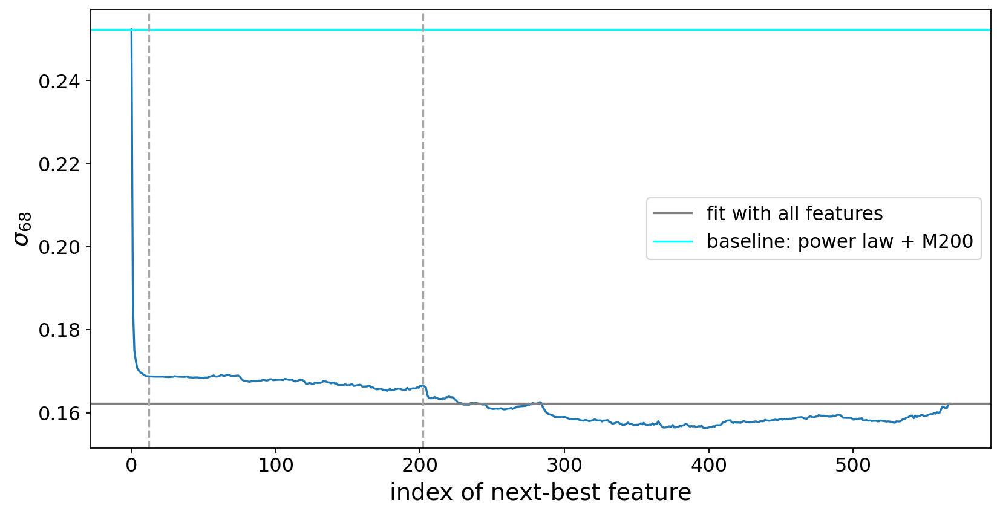

In [32]:
plt.figure(figsize=(12,6))
errors_best_withfirst = [error_powerlawM] + errors_best
plt.plot(errors_best_withfirst)
plt.axhline(error_all, color='grey', label='fit with all features')
#plt.axhline(error_powerlaw, color='magenta', label='fit with all')
plt.axhline(error_powerlawM, color='cyan', label='baseline: power law + M200')

n_min = np.argmin(errors_best)
plt.axvline(12, color='darkgrey', ls='--')
plt.axvline(202, color='darkgrey', ls='--')
#plt.axvline(n_min, color='darkgrey', ls='--')
print(n_min)
plt.xlabel('index of next-best feature')
plt.ylabel(r'$\sigma_{68}$')

plt.legend(fontsize=14)

397


(-1.0, 20.0)

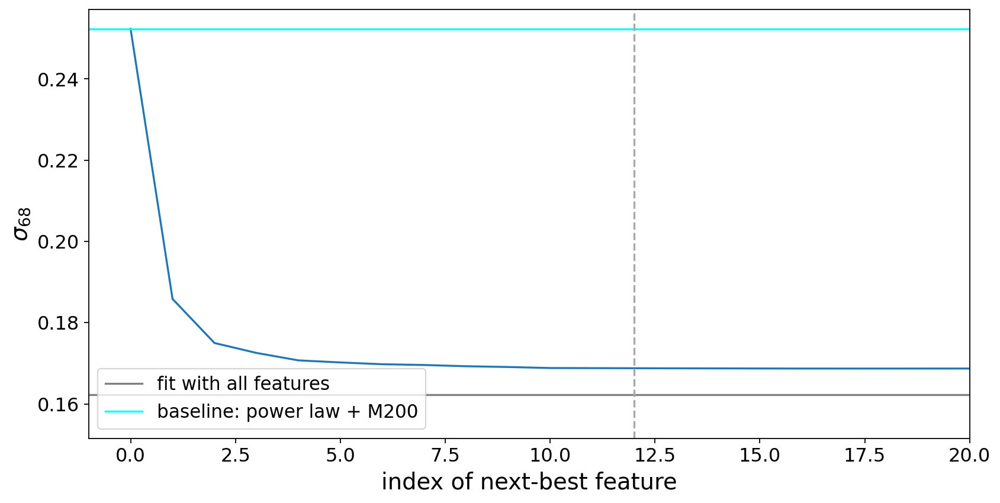

In [33]:
plt.figure(figsize=(12,6))
errors_best_withfirst = [error_powerlawM] + errors_best
plt.plot(errors_best_withfirst)
plt.axhline(error_all, color='grey', label='fit with all features')
#plt.axhline(error_powerlaw, color='magenta', label='fit with all')
plt.axhline(error_powerlawM, color='cyan', label='baseline: power law + M200')

n_min = np.argmin(errors_best)
#plt.axvline(5, color='darkgrey', ls='--')
plt.axvline(12, color='darkgrey', ls='--')
#plt.axvline(n_min, color='darkgrey', ls='--')
print(n_min)
plt.xlabel('index of next-best feature')
plt.ylabel(r'$\sigma_{68}$')

plt.legend(fontsize=14)

plt.xlim(-1,20)

In [34]:
for group in groups:
    for idx in group:
        display(Markdown(scalar_name(s_feats[idx], geo_feature_arr_pseudo)))
    print()

$\lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$[\frac{1}{2} (C^{xv}_1 + C^{vx}_1)]_{jk} \, [\frac{1}{2} (C^{xv}_1 + C^{vx}_1)]_{jk}$

$\lambda_3\left(C^{xx}_1\right) \, \lambda_3\left(C^{xx}_1\right)$

$\lambda_1\left(C^{xx}_1\right) \, \lambda_1\left(C^{xx}_1\right)$

$\lambda_3\left(C^{xx}_2\right) \, \lambda_3\left(C^{xx}_2\right)$

$\lambda_1\left(C^{xx}_2\right) \, \lambda_1\left(C^{xx}_2\right)$

$\lambda_1\left(C^{vv}_2\right) \, \lambda_1\left(C^{vv}_2\right)$

$[C^{vv}_2]_{jk} \, [C^{vv}_2]_{jk}$

$\lambda_1\left(C^{vv}_0\right) \, \lambda_1\left(C^{vv}_0\right)$

$[C^{vv}_0]_{jk} \, [C^{vv}_0]_{jk}$

$[C^{vv}_1]_{jk} \, [C^{vv}_1]_{jk}$

$\lambda_3\left(C^{vv}_1\right) \, \lambda_3\left(C^{vv}_1\right)$

$[\frac{1}{2} (C^{xv}_2 + C^{vx}_2)]_{jk} \, [\frac{1}{2} (C^{xv}_2 + C^{vx}_2)]_{jk}$

$\lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_1\left(C^{xx}_0\right) \, \lambda_1\left(C^{xx}_0\right)$

$\lambda_2\left(C^{xx}_0\right) \, \lambda_2\left(C^{xx}_0\right)$

$\lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_2\left(C^{xx}_0\right) \, \lambda_2\left(C^{xx}_0\right)$

Looks like there is a group for a feature g where 3 add up to the 4th, or something:

$\lamdba_1(g) \lamdba_1(g)$, $\lamdba_2(g) \lamdba_2(g)$,  $\lamdba_3(g) \lamdba_3(g)$, $[g]_{jk} \, [g]_{jk}$

And the last group is bc all of the other members of both groups were already there

### Visualize halos

In [35]:
nrows = 2
ncols = 3
n_plot = nrows * ncols

In [36]:
len(idx_test), len(idx_val)

(3015, 3015)

In [37]:
i_best = 0
idx_feat = idxs_ordered_best[i_best]

In [38]:
features = np.atleast_2d(features_all[:,idx_feat]).T
print(features.shape)
fitter_single = LinearFitter(features, log_m_stellar, 
                    y_val_current_powerlaw_fit, uncertainties=uncertainties_genel2019,
                    x_features_extra=x_features_extra)
fitter_single.split_train_test(idx_train, idx_val)
fitter_single.scale_and_fit(rms_x=True, log_x=False, log_y=False)
fitter_single.predict_test()

(20098, 1)


(-1.3574467981772047, 1.8958097779885383)

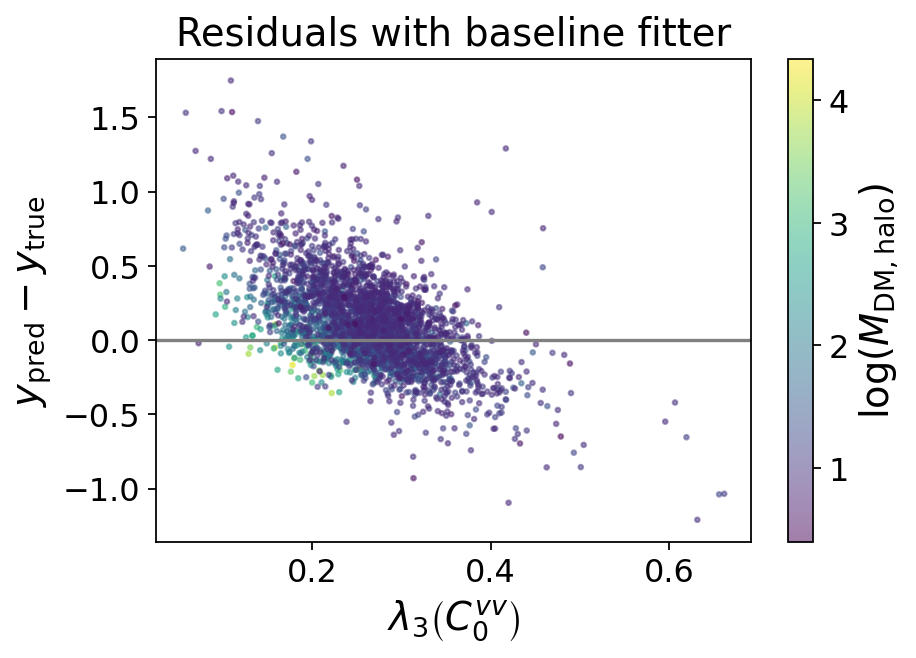

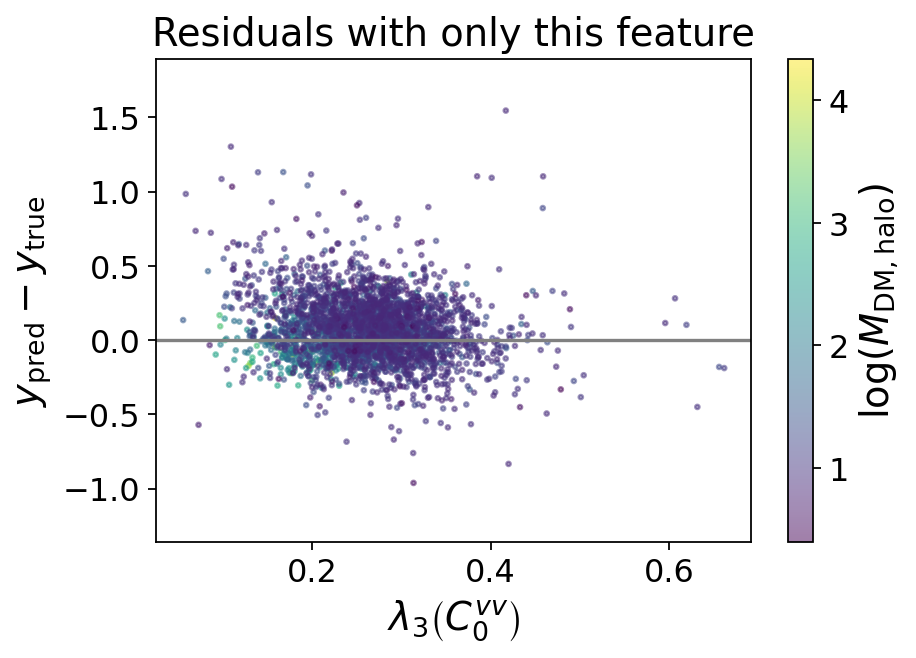

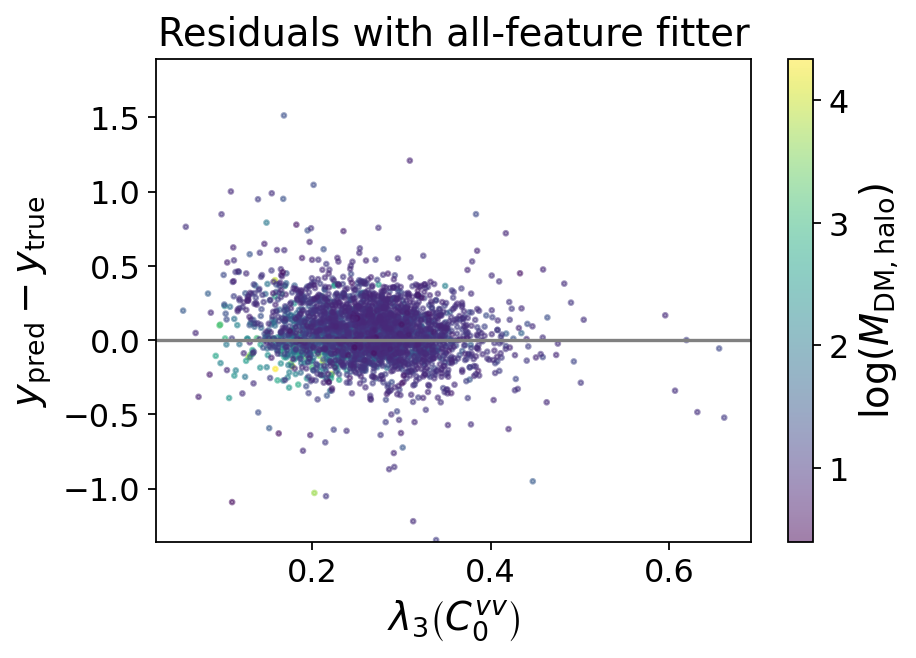

In [39]:
diffs_M = fitter_M.y_scalar_pred - fitter_M.y_scalar_test
diffs_all = fitter_all.y_scalar_pred - fitter_all.y_scalar_test
diffs_single = fitter_single.y_scalar_pred - fitter_single.y_scalar_test

plt.figure()
plt.title("Residuals with baseline fitter")
plt.scatter(features_all[idx_val,idx_feat], diffs_M, c=log_m_200m[idx_val], s=4, alpha=0.5)
plt.colorbar(label=r'log($M_\mathrm{DM,halo}$)')
plt.axhline(0, color='grey')
plt.xlabel(rf'{scalar_name(feature_arr_all[0][idx_feat], geo_feature_arr_pseudo)}')
plt.ylabel(r'$y_\mathrm{pred} - y_\mathrm{true}$')
ax = plt.gca()
ylim = ax.get_ylim()

plt.figure()
plt.title("Residuals with only this feature")
plt.scatter(features_all[idx_val,idx_feat], diffs_single, c=log_m_200m[idx_val], s=4, alpha=0.5)
plt.colorbar(label=r'log($M_\mathrm{DM,halo}$)')
plt.axhline(0, color='grey')
plt.xlabel(rf'{scalar_name(feature_arr_all[0][idx_feat], geo_feature_arr_pseudo)}')
plt.ylabel(r'$y_\mathrm{pred} - y_\mathrm{true}$')
plt.ylim(ylim)

plt.figure()
plt.title("Residuals with all-feature fitter")
plt.scatter(features_all[idx_val,idx_feat], diffs_all, c=log_m_200m[idx_val], s=4, alpha=0.5)
plt.colorbar(label=r'log($M_\mathrm{DM,halo}$)')
plt.axhline(0, color='grey')
plt.xlabel(rf'{scalar_name(feature_arr_all[0][idx_feat], geo_feature_arr_pseudo)}')
plt.ylabel(r'$y_\mathrm{pred} - y_\mathrm{true}$')
plt.ylim(ylim)

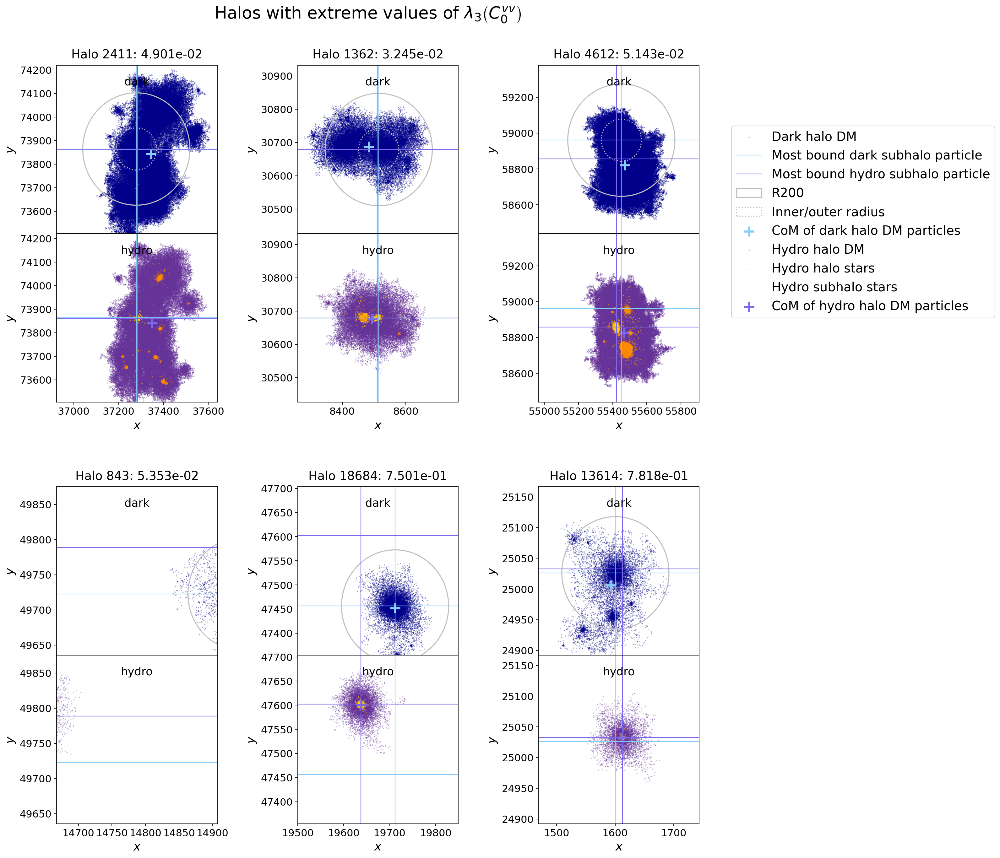

In [40]:
i_best = 0
idx_feat = idxs_ordered_best[i_best]
name_feat = 'Halos with extreme values of '+scalar_name(feature_arr_all[0][idx_feat], geo_feature_arr_pseudo)
n_each = int(n_plot/2)
# BUG HERE - corrupted h5 file, so instead im just skipping the first (lowest) one
idxs_halos_low = np.argpartition(features_all[:,idx_feat], n_each)[:n_each+1]
idxs_halos_high = np.argpartition(features_all[:,idx_feat], -n_each)[-n_each:]
idxs_halos = np.concatenate((idxs_halos_low, idxs_halos_high))
halos = sim_reader.dark_halo_arr[idxs_halos][1:]
titles = [f'Halo {idx_halo}: {features_all[idx_halo, idx_feat]:.3e}' for idx_halo in idxs_halos]
plotter.plot_halos_dark_and_hydro(halos, sim_reader.base_path_dark, sim_reader.base_path_hydro, sim_reader.snap_num,
                             nrows, ncols, titles, title=name_feat)

In [41]:
i_best = 1
idx_feat = idxs_ordered_best[i_best]

features = np.atleast_2d(features_all[:,idx_feat]).T
print(features.shape)
fitter_single = LinearFitter(features, log_m_stellar, 
                    y_val_current_powerlaw_fit, uncertainties=uncertainties_genel2019,
                    x_features_extra=x_features_extra)
fitter_single.split_train_test(idx_train, idx_val)
fitter_single.scale_and_fit(rms_x=True, log_x=False, log_y=False)
fitter_single.predict_test()

(20098, 1)


(-1.3574467981772047, 1.8958097779885383)

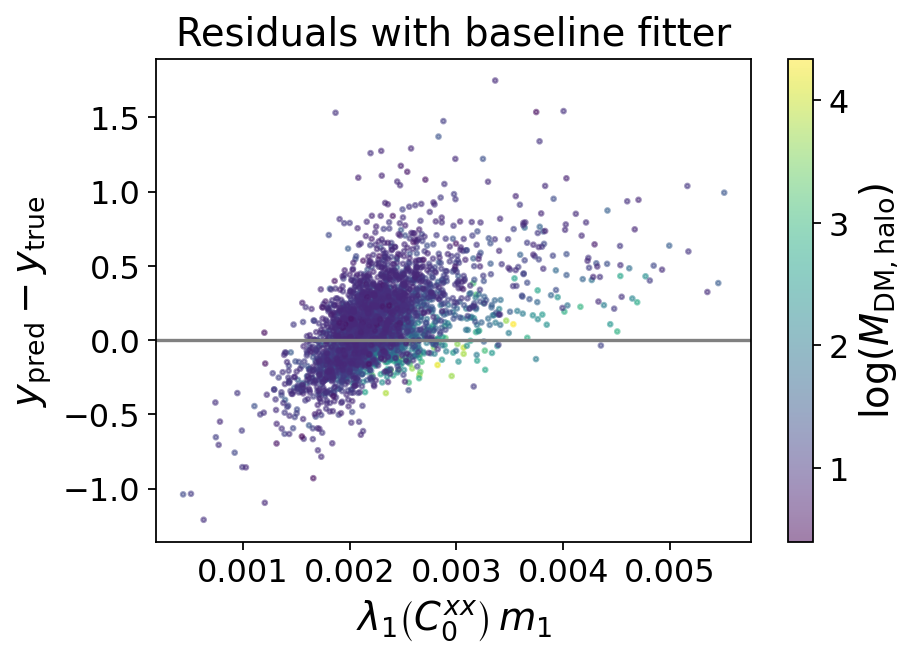

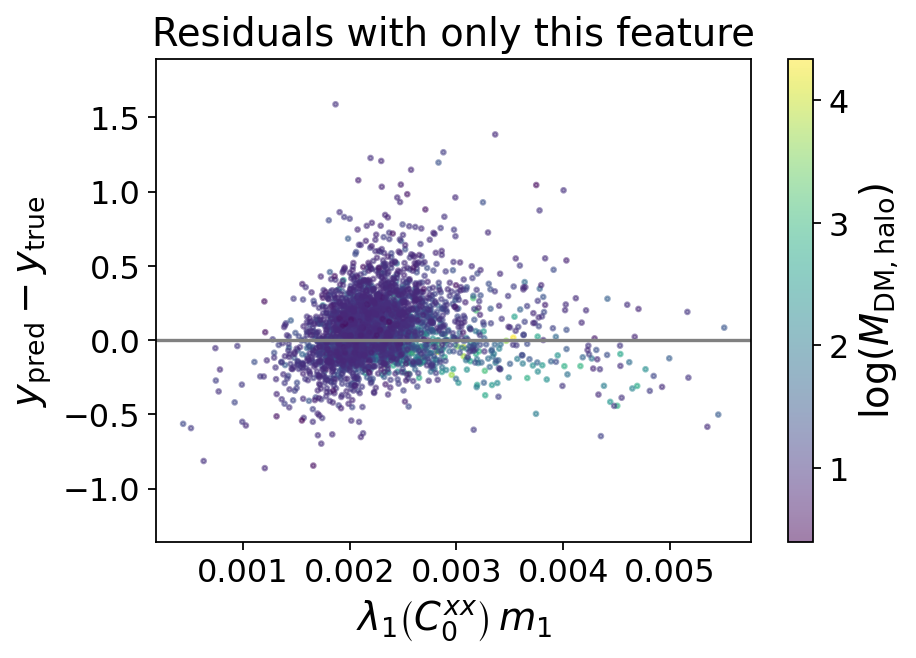

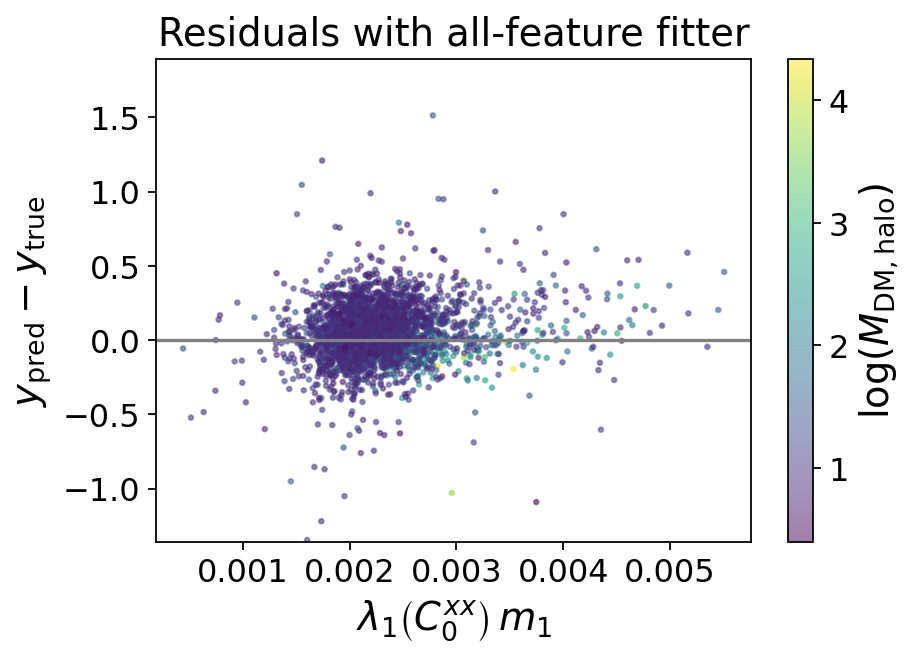

In [42]:
diffs_M = fitter_M.y_scalar_pred - fitter_M.y_scalar_test
diffs_all = fitter_all.y_scalar_pred - fitter_all.y_scalar_test
diffs_single = fitter_single.y_scalar_pred - fitter_single.y_scalar_test

plt.figure()
plt.title("Residuals with baseline fitter")
plt.scatter(features_all[idx_val,idx_feat], diffs_M, c=log_m_200m[idx_val], s=4, alpha=0.5)
plt.colorbar(label=r'log($M_\mathrm{DM,halo}$)')
plt.axhline(0, color='grey')
plt.xlabel(rf'{scalar_name(feature_arr_all[0][idx_feat], geo_feature_arr_pseudo)}')
plt.ylabel(r'$y_\mathrm{pred} - y_\mathrm{true}$')
ax = plt.gca()
ylim = ax.get_ylim()

plt.figure()
plt.title("Residuals with only this feature")
plt.scatter(features_all[idx_val,idx_feat], diffs_single, c=log_m_200m[idx_val], s=4, alpha=0.5)
plt.colorbar(label=r'log($M_\mathrm{DM,halo}$)')
plt.axhline(0, color='grey')
plt.xlabel(rf'{scalar_name(feature_arr_all[0][idx_feat], geo_feature_arr_pseudo)}')
plt.ylabel(r'$y_\mathrm{pred} - y_\mathrm{true}$')
plt.ylim(ylim)

plt.figure()
plt.title("Residuals with all-feature fitter")
plt.scatter(features_all[idx_val,idx_feat], diffs_all, c=log_m_200m[idx_val], s=4, alpha=0.5)
plt.colorbar(label=r'log($M_\mathrm{DM,halo}$)')
plt.axhline(0, color='grey')
plt.xlabel(rf'{scalar_name(feature_arr_all[0][idx_feat], geo_feature_arr_pseudo)}')
plt.ylabel(r'$y_\mathrm{pred} - y_\mathrm{true}$')
plt.ylim(ylim)

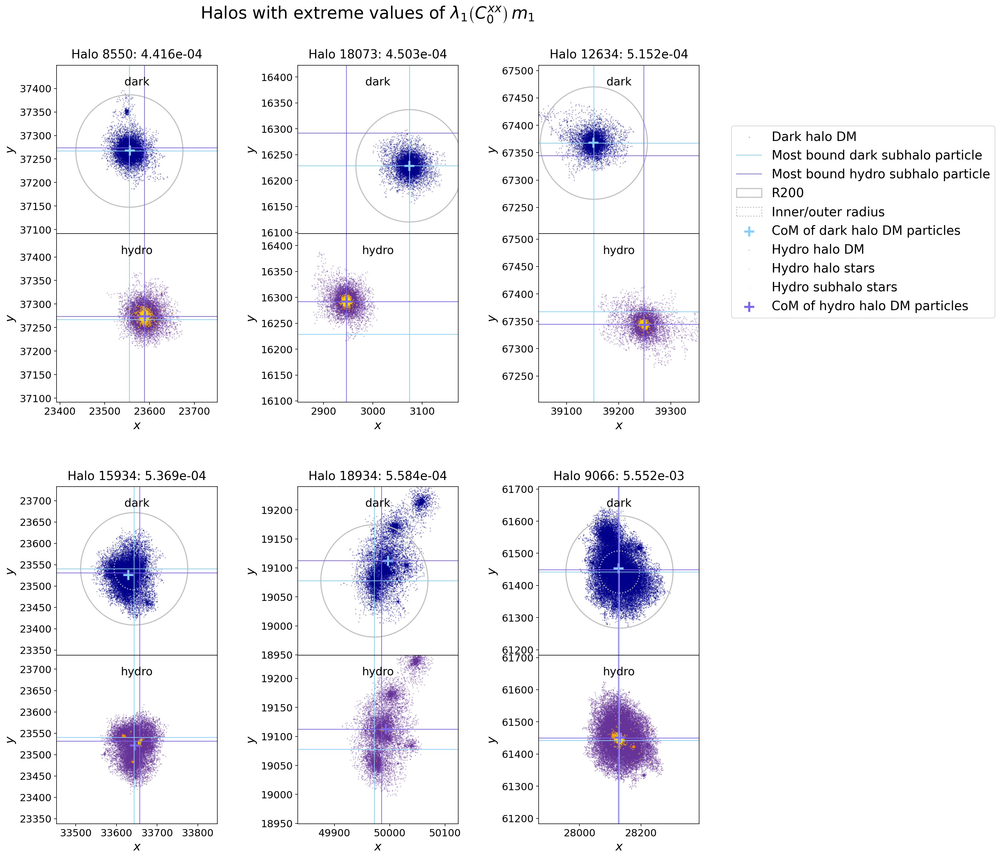

In [43]:
i_best = 1
idx_feat = idxs_ordered_best[i_best]
name_feat = scalar_name(feature_arr_all[0][idx_feat], geo_feature_arr_pseudo)
title_feat = 'Halos with extreme values of '+name_feat
n_each = int(n_plot/2)
# BUG AGAIN - doing hacky thing, not exactlt the lowest halos
idxs_halos_low = np.argpartition(features_all[:,idx_feat], n_each)[:n_each+2]
idxs_halos_high = np.argpartition(features_all[:,idx_feat], -n_each)[-n_each:]
idxs_halos = np.concatenate((idxs_halos_low, idxs_halos_high))
halos = sim_reader.dark_halo_arr[idxs_halos][2:]
titles = [f'Halo {idx_halo}: {features_all[idx_halo, idx_feat]:.3e}' for idx_halo in idxs_halos]
plotter.plot_halos_dark_and_hydro(halos, sim_reader.base_path_dark, sim_reader.base_path_hydro, sim_reader.snap_num,
                             nrows, ncols, titles, title=title_feat)

In [44]:
i_best = 2
idx_feat = idxs_ordered_best[i_best]

features = np.atleast_2d(features_all[:,idx_feat]).T
print(features.shape)
fitter_single = LinearFitter(features, log_m_stellar, 
                    y_val_current_powerlaw_fit, uncertainties=uncertainties_genel2019,
                    x_features_extra=x_features_extra)
fitter_single.split_train_test(idx_train, idx_val)
fitter_single.scale_and_fit(rms_x=True, log_x=False, log_y=False)
fitter_single.predict_test()

(20098, 1)


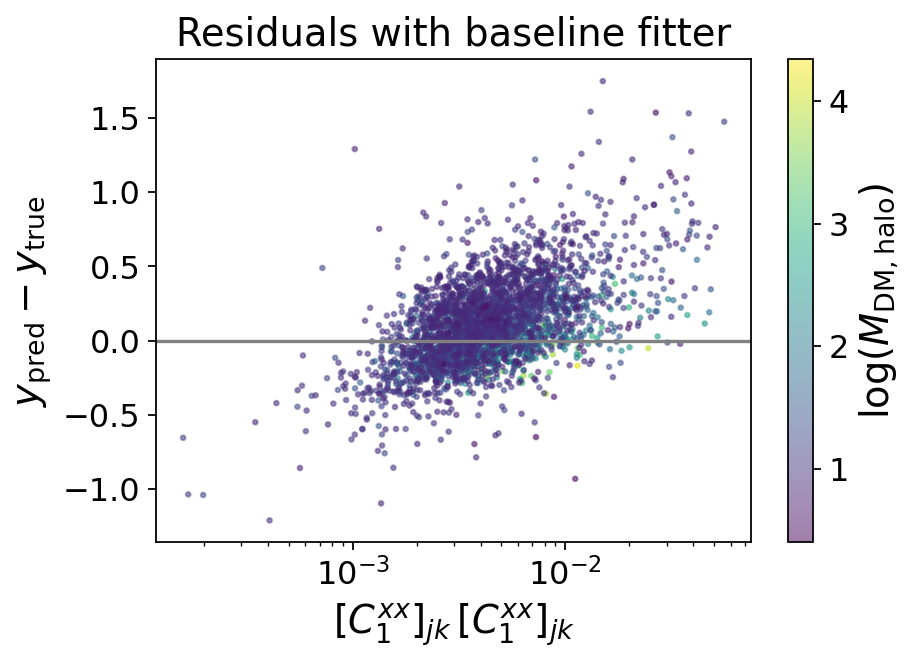

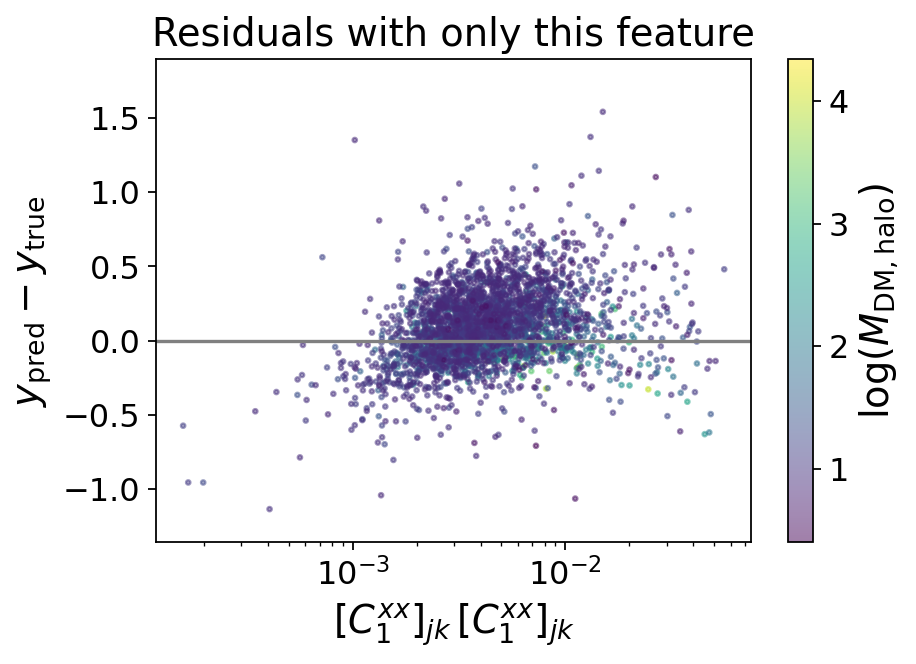

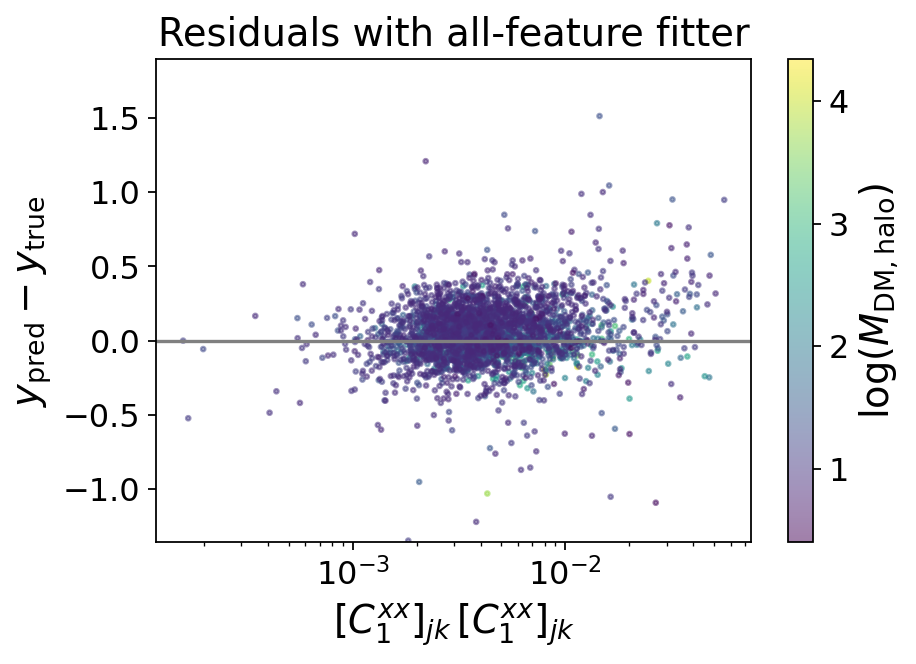

In [45]:
diffs_M = fitter_M.y_scalar_pred - fitter_M.y_scalar_test
diffs_all = fitter_all.y_scalar_pred - fitter_all.y_scalar_test
diffs_single = fitter_single.y_scalar_pred - fitter_single.y_scalar_test

plt.figure()
plt.title("Residuals with baseline fitter")
plt.scatter(features_all[idx_val,idx_feat], diffs_M, c=log_m_200m[idx_val], s=4, alpha=0.5)
plt.colorbar(label=r'log($M_\mathrm{DM,halo}$)')
plt.axhline(0, color='grey')
plt.xlabel(rf'{scalar_name(feature_arr_all[0][idx_feat], geo_feature_arr_pseudo)}')
plt.ylabel(r'$y_\mathrm{pred} - y_\mathrm{true}$')
ax = plt.gca()
ylim = ax.get_ylim()
plt.xscale('log')

plt.figure()
plt.title("Residuals with only this feature")
plt.scatter(features_all[idx_val,idx_feat], diffs_single, c=log_m_200m[idx_val], s=4, alpha=0.5)
plt.colorbar(label=r'log($M_\mathrm{DM,halo}$)')
plt.axhline(0, color='grey')
plt.xlabel(rf'{scalar_name(feature_arr_all[0][idx_feat], geo_feature_arr_pseudo)}')
plt.ylabel(r'$y_\mathrm{pred} - y_\mathrm{true}$')
plt.ylim(ylim)
plt.xscale('log')

plt.figure()
plt.title("Residuals with all-feature fitter")
plt.scatter(features_all[idx_val,idx_feat], diffs_all, c=log_m_200m[idx_val], s=4, alpha=0.5)
plt.colorbar(label=r'log($M_\mathrm{DM,halo}$)')
plt.axhline(0, color='grey')
plt.xlabel(rf'{scalar_name(feature_arr_all[0][idx_feat], geo_feature_arr_pseudo)}')
plt.ylabel(r'$y_\mathrm{pred} - y_\mathrm{true}$')
plt.ylim(ylim)
plt.xscale('log')

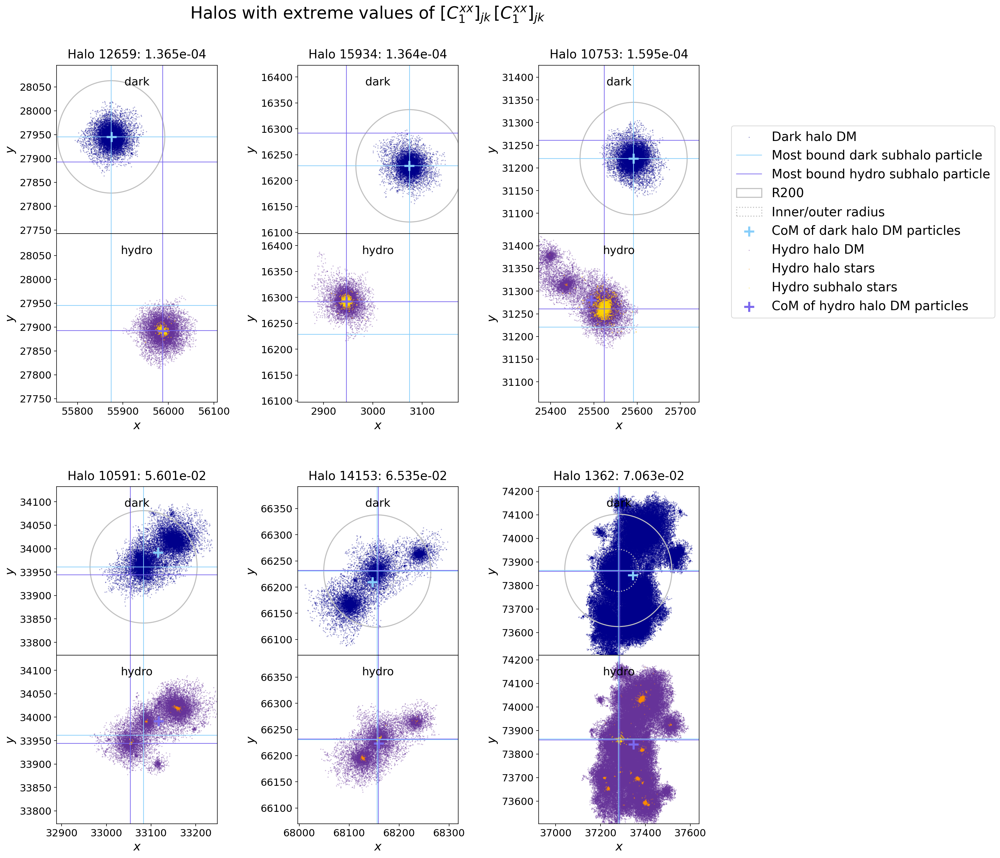

In [47]:
i_best = 2
idx_feat = idxs_ordered_best[i_best]
name_feat = scalar_name(feature_arr_all[0][idx_feat], geo_feature_arr_pseudo)
title_feat = 'Halos with extreme values of '+name_feat
n_each = int(n_plot/2)
idxs_halos_low = np.argpartition(features_all[:,idx_feat], n_each)[:n_each]
idxs_halos_high = np.argpartition(features_all[:,idx_feat], -n_each)[-n_each:]
idxs_halos = np.concatenate((idxs_halos_low, idxs_halos_high))
halos = sim_reader.dark_halo_arr[idxs_halos]
titles = [f'Halo {idx_halo}: {features_all[idx_halo, idx_feat]:.3e}' for idx_halo in idxs_halos]
plotter.plot_halos_dark_and_hydro(halos, sim_reader.base_path_dark, sim_reader.base_path_hydro, sim_reader.snap_num,
                             nrows, ncols, titles, title=title_feat)